In [1]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [2]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns
from scipy.stats import zscore
from scipy import stats
import numpy as np
import os


In [3]:
# ML Models
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# calculate accuracy measures and confusion matrix
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

### 1. Data pre-processing - Understand the data and treat missing values (Use box plot), outliers (5 points)

In [4]:

df = pd.read_csv('vehicle.csv')
df.head()
df.tail()
df.shape
df.dtypes
df.describe().transpose()
df.info
df.describe()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus


,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
841,93,39.0,87.0,183.0,64.0,8,169.0,40.0,20.0,134,200.0,422.0,149.0,72.0,7.0,25.0,188.0,195,car
842,89,46.0,84.0,163.0,66.0,11,159.0,43.0,20.0,159,173.0,368.0,176.0,72.0,1.0,20.0,186.0,197,van
843,106,54.0,101.0,222.0,67.0,12,222.0,30.0,25.0,173,228.0,721.0,200.0,70.0,3.0,4.0,187.0,201,car
844,86,36.0,78.0,146.0,58.0,7,135.0,50.0,18.0,124,155.0,270.0,148.0,66.0,0.0,25.0,190.0,195,car
845,85,36.0,66.0,123.0,55.0,5,120.0,56.0,17.0,128,140.0,212.0,131.0,73.0,1.0,18.0,186.0,190,van


(846, 19)

compactness                      int64
circularity                    float64
distance_circularity           float64
radius_ratio                   float64
pr.axis_aspect_ratio           float64
max.length_aspect_ratio          int64
scatter_ratio                  float64
elongatedness                  float64
pr.axis_rectangularity         float64
max.length_rectangularity        int64
scaled_variance                float64
scaled_variance.1              float64
scaled_radius_of_gyration      float64
scaled_radius_of_gyration.1    float64
skewness_about                 float64
skewness_about.1               float64
skewness_about.2               float64
hollows_ratio                    int64
class                           object
dtype: object

,count,mean,std,min,25%,50%,75%,max
compactness,846.0,93.678487,8.234474,73.0,87.00,93.0,100.0,119.0
circularity,841.0,44.828775,6.152172,33.0,40.00,44.0,49.0,59.0
distance_circularity,842.0,82.110451,15.778292,40.0,70.00,80.0,98.0,112.0
radius_ratio,840.0,168.888095,33.520198,104.0,141.00,167.0,195.0,333.0
pr.axis_aspect_ratio,844.0,61.678910,7.891463,47.0,57.00,61.0,65.0,138.0
max.length_aspect_ratio,846.0,8.567376,4.601217,2.0,7.00,8.0,10.0,55.0
scatter_ratio,845.0,168.901775,33.214848,112.0,147.00,157.0,198.0,265.0
elongatedness,845.0,40.933728,7.816186,26.0,33.00,43.0,46.0,61.0
pr.axis_rectangularity,843.0,20.582444,2.592933,17.0,19.00,20.0,23.0,29.0
max.length_rectangularity,846.0,147.998818,14.515652,118.0,137.00,146.0,159.0,188.0


<bound method DataFrame.info of      compactness  circularity  distance_circularity  radius_ratio  \
0             95         48.0                  83.0         178.0   
1             91         41.0                  84.0         141.0   
2            104         50.0                 106.0         209.0   
3             93         41.0                  82.0         159.0   
4             85         44.0                  70.0         205.0   
5            107          NaN                 106.0         172.0   
6             97         43.0                  73.0         173.0   
7             90         43.0                  66.0         157.0   
8             86         34.0                  62.0         140.0   
9             93         44.0                  98.0           NaN   
10            86         36.0                  70.0         143.0   
11            90         34.0                  66.0         136.0   
12            88         46.0                  74.0         171.0   
13

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
count,846.000000,841.000000,842.000000,840.000000,844.000000,846.000000,845.000000,845.000000,843.000000,846.000000,843.000000,844.000000,844.000000,842.000000,840.000000,845.000000,845.000000,846.000000
mean,93.678487,44.828775,82.110451,168.888095,61.678910,8.567376,168.901775,40.933728,20.582444,147.998818,188.631079,439.494076,174.709716,72.447743,6.364286,12.602367,188.919527,195.632388
std,8.234474,6.152172,15.778292,33.520198,7.891463,4.601217,33.214848,7.816186,2.592933,14.515652,31.411004,176.666903,32.584808,7.486190,4.920649,8.936081,6.155809,7.438797
min,73.000000,33.000000,40.000000,104.000000,47.000000,2.000000,112.000000,26.000000,17.000000,118.000000,130.000000,184.000000,109.000000,59.000000,0.000000,0.000000,176.000000,181.000000
25%,87.000000,40.000000,70.000000,141.000000,57.000000,7.000000,147.000000,33.000000,19.000000,137.000000,167.000000,318.000000,149.000000,67.000000,2.000000,5.000000,184.000000,190.250000
50%,93.000000,44.000000,80.000000,167.000000,61.000000,8.000000,157.000000,43.000000,20.000000,146.000000,179.000000,363.500000,173.500000,71.500000,6.000000,11.000000,188.000000,197.000000
75%,100.000000,49.000000,98.000000,195.000000,65.000000,10.000000,198.000000,46.000000,23.000000,159.000000,217.000000,587.000000,198.000000,75.000000,9.000000,19.000000,193.000000,201.000000
max,119.000000,59.000000,112.000000,333.000000,138.000000,55.000000,265.000000,61.000000,29.000000,188.000000,320.000000,1018.000000,268.000000,135.000000,22.000000,41.000000,206.000000,211.000000


All the independent columns are of numeric type, the Target column is of type string.

In [5]:
df.isnull().values.any()
df.isnull().sum().sum()
df.isna().values.any()
df.isna().sum().sum()
df.groupby(["class"]).count()

# Check whether any column has null values
df.apply(lambda x : sum(x.isnull()))
df.apply(lambda x : sum(x.isna()))
# Finding the unique data
df.apply(lambda x: len(x.unique()))

True

41

True

41

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
class,,,,,,,,,,,,,,,,,,
bus,218,214,215,216,217,218,218,218,217,218,218,218,216,217,214,218,218,218
car,429,428,429,426,428,429,428,428,428,429,427,427,429,426,427,428,428,429
van,199,199,198,198,199,199,199,199,198,199,198,199,199,199,199,199,199,199


compactness                    0
circularity                    5
distance_circularity           4
radius_ratio                   6
pr.axis_aspect_ratio           2
max.length_aspect_ratio        0
scatter_ratio                  1
elongatedness                  1
pr.axis_rectangularity         3
max.length_rectangularity      0
scaled_variance                3
scaled_variance.1              2
scaled_radius_of_gyration      2
scaled_radius_of_gyration.1    4
skewness_about                 6
skewness_about.1               1
skewness_about.2               1
hollows_ratio                  0
class                          0
dtype: int64

compactness                    0
circularity                    5
distance_circularity           4
radius_ratio                   6
pr.axis_aspect_ratio           2
max.length_aspect_ratio        0
scatter_ratio                  1
elongatedness                  1
pr.axis_rectangularity         3
max.length_rectangularity      0
scaled_variance                3
scaled_variance.1              2
scaled_radius_of_gyration      2
scaled_radius_of_gyration.1    4
skewness_about                 6
skewness_about.1               1
skewness_about.2               1
hollows_ratio                  0
class                          0
dtype: int64

compactness                     44
circularity                     28
distance_circularity            64
radius_ratio                   135
pr.axis_aspect_ratio            38
max.length_aspect_ratio         21
scatter_ratio                  132
elongatedness                   36
pr.axis_rectangularity          14
max.length_rectangularity       66
scaled_variance                129
scaled_variance.1              423
scaled_radius_of_gyration      144
scaled_radius_of_gyration.1     40
skewness_about                  24
skewness_about.1                42
skewness_about.2                31
hollows_ratio                   31
class                            3
dtype: int64

There are total of 41 records with zero or null value in at least one variable

The mean and median values are almost inline for most of the variables. distance_circularity,scatter_ratio,elongatedness, scaled_variance,scaled_variance.1 and hollows_ratio are skewed and can be due to outliers

In [6]:
# replace the missing values in pima_df with median value :Note, we do not need to specify the column names
# every column's missing value is replaced with that column's median respectively
df = df.fillna(df.median())

In [7]:
df.isnull().values.any()
df.isnull().sum().sum()
df.isna().values.any()
df.isna().sum().sum()
df.groupby(["class"]).count()

# Check whether any column has null values
df.apply(lambda x : sum(x.isnull()))
df.apply(lambda x : sum(x.isna()))


False

0

False

0

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
class,,,,,,,,,,,,,,,,,,
bus,218,218,218,218,218,218,218,218,218,218,218,218,218,218,218,218,218,218
car,429,429,429,429,429,429,429,429,429,429,429,429,429,429,429,429,429,429
van,199,199,199,199,199,199,199,199,199,199,199,199,199,199,199,199,199,199


compactness                    0
circularity                    0
distance_circularity           0
radius_ratio                   0
pr.axis_aspect_ratio           0
max.length_aspect_ratio        0
scatter_ratio                  0
elongatedness                  0
pr.axis_rectangularity         0
max.length_rectangularity      0
scaled_variance                0
scaled_variance.1              0
scaled_radius_of_gyration      0
scaled_radius_of_gyration.1    0
skewness_about                 0
skewness_about.1               0
skewness_about.2               0
hollows_ratio                  0
class                          0
dtype: int64

compactness                    0
circularity                    0
distance_circularity           0
radius_ratio                   0
pr.axis_aspect_ratio           0
max.length_aspect_ratio        0
scatter_ratio                  0
elongatedness                  0
pr.axis_rectangularity         0
max.length_rectangularity      0
scaled_variance                0
scaled_variance.1              0
scaled_radius_of_gyration      0
scaled_radius_of_gyration.1    0
skewness_about                 0
skewness_about.1               0
skewness_about.2               0
hollows_ratio                  0
class                          0
dtype: int64

In [8]:
df_1= df.drop(labels = "class", axis = 1)

df_c=df["class"]


In [9]:
df_z = df_1.apply(zscore)

In [10]:
df_f = pd.concat([df_z,df_c], axis= 1)

In [11]:
df_f.head()
df_f.tail()
df_f.shape
df_f.dtypes
df_f.describe().transpose()
df_f.info
df_f.describe()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,0.160580,0.518073,0.057177,0.273363,1.310398,0.311542,-0.207598,0.136262,-0.224342,0.758332,-0.401920,-0.341934,0.285705,-0.327326,-0.073812,0.380870,-0.312012,0.183957,van
1,-0.325470,-0.623732,0.120741,-0.835032,-0.593753,0.094079,-0.599423,0.520519,-0.610886,-0.344578,-0.593357,-0.619724,-0.513630,-0.059384,0.538390,0.156798,0.013265,0.452977,van
2,1.254193,0.844303,1.519141,1.202018,0.548738,0.311542,1.148719,-1.144597,0.935290,0.689401,1.097671,1.109379,1.392477,0.074587,1.558727,-0.403383,-0.149374,0.049447,car
3,-0.082445,-0.623732,-0.006386,-0.295813,0.167907,0.094079,-0.750125,0.648605,-0.610886,-0.344578,-0.912419,-0.738777,-1.466683,-1.265121,-0.073812,-0.291347,1.639649,1.529056,van
4,-1.054545,-0.134387,-0.769150,1.082192,5.245643,9.444962,-0.599423,0.520519,-0.610886,-0.275646,1.671982,-0.648070,0.408680,7.309005,0.538390,-0.179311,-1.450481,-1.699181,bus


,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
841,-0.082445,-0.949961,0.311432,0.423146,0.294851,-0.123383,0.003385,-0.119910,-0.224342,-0.964965,0.363829,-0.098159,-0.790323,-0.059384,0.130256,1.389197,-0.149374,-0.085062,car
842,-0.568495,0.191843,0.120741,-0.175986,0.548738,0.529004,-0.298019,0.264347,-0.224342,0.758332,-0.497638,-0.404295,0.039756,-0.059384,-1.094148,0.829015,-0.474650,0.183957,van
843,1.497218,1.496763,1.201323,1.591454,0.675681,0.746467,1.600825,-1.400769,1.708378,1.723379,1.257202,1.596929,0.777604,-0.327326,-0.686013,-0.963565,-0.312012,0.721997,car
844,-0.933032,-1.439306,-0.260641,-0.685249,-0.466810,-0.340845,-1.021388,1.160948,-0.997430,-1.654284,-1.071950,-0.959876,-0.821066,-0.863208,-1.298215,1.389197,0.175903,-0.085062,car
845,-1.054545,-1.439306,-1.023405,-1.374251,-0.847640,-0.775770,-1.473494,1.929463,-1.383974,-1.378557,-1.550542,-1.288689,-1.343709,0.074587,-1.094148,0.604943,-0.474650,-0.757612,van


(846, 19)

compactness                    float64
circularity                    float64
distance_circularity           float64
radius_ratio                   float64
pr.axis_aspect_ratio           float64
max.length_aspect_ratio        float64
scatter_ratio                  float64
elongatedness                  float64
pr.axis_rectangularity         float64
max.length_rectangularity      float64
scaled_variance                float64
scaled_variance.1              float64
scaled_radius_of_gyration      float64
scaled_radius_of_gyration.1    float64
skewness_about                 float64
skewness_about.1               float64
skewness_about.2               float64
hollows_ratio                  float64
class                           object
dtype: object

,count,mean,std,min,25%,50%,75%,max
compactness,846.0,5.572112e-16,1.000592,-2.512695,-0.811520,-0.082445,0.768143,3.076880
circularity,846.0,-1.018361e-16,1.000592,-1.928651,-0.786846,-0.134387,0.681188,2.312338
distance_circularity,846.0,2.370051e-16,1.000592,-2.676060,-0.769150,-0.133514,1.010632,1.900523
radius_ratio,846.0,8.871286e-17,1.000592,-1.943427,-0.835032,-0.056160,0.782625,4.916638
pr.axis_aspect_ratio,846.0,3.732239e-16,1.000592,-1.863187,-0.593753,-0.085979,0.421794,9.688661
max.length_aspect_ratio,846.0,-2.036721e-16,1.000592,-1.428157,-0.340845,-0.123383,0.311542,10.097349
scatter_ratio,846.0,-4.391024e-16,1.000592,-1.714617,-0.659704,-0.358300,0.877456,2.896861
elongatedness,846.0,-8.582575e-17,1.000592,-1.913112,-1.016511,0.264347,0.648605,2.569893
pr.axis_rectangularity,846.0,-4.320159e-16,1.000592,-1.383974,-0.610886,-0.224342,0.935290,3.254554
max.length_rectangularity,846.0,7.968409e-16,1.000592,-2.067876,-0.758169,-0.137782,0.758332,2.757358


<bound method DataFrame.info of      compactness  circularity  distance_circularity  radius_ratio  \
0       0.160580     0.518073              0.057177      0.273363   
1      -0.325470    -0.623732              0.120741     -0.835032   
2       1.254193     0.844303              1.519141      1.202018   
3      -0.082445    -0.623732             -0.006386     -0.295813   
4      -1.054545    -0.134387             -0.769150      1.082192   
5       1.618730    -0.134387              1.519141      0.093623   
6       0.403605    -0.297502             -0.578459      0.123580   
7      -0.446982    -0.297502             -1.023405     -0.355726   
8      -0.933032    -1.765536             -1.277659     -0.864988   
9      -0.082445    -0.134387              1.010632     -0.056160   
10     -0.933032    -1.439306             -0.769150     -0.775119   
11     -0.446982    -1.765536             -1.023405     -0.984815   
12     -0.690007     0.191843             -0.514896      0.063667   
13

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
count,8.460000e+02,8.460000e+02,8.460000e+02,8.460000e+02,8.460000e+02,8.460000e+02,8.460000e+02,8.460000e+02,8.460000e+02,8.460000e+02,8.460000e+02,8.460000e+02,8.460000e+02,8.460000e+02,8.460000e+02,8.460000e+02,8.460000e+02,8.460000e+02
mean,5.572112e-16,-1.018361e-16,2.370051e-16,8.871286e-17,3.732239e-16,-2.036721e-16,-4.391024e-16,-8.582575e-17,-4.320159e-16,7.968409e-16,-8.845039e-17,-1.057730e-16,1.742761e-16,-1.785904e-16,-2.782119e-17,-3.910715e-17,-1.370850e-15,1.544470e-15
std,1.000592e+00,1.000592e+00,1.000592e+00,1.000592e+00,1.000592e+00,1.000592e+00,1.000592e+00,1.000592e+00,1.000592e+00,1.000592e+00,1.000592e+00,1.000592e+00,1.000592e+00,1.000592e+00,1.000592e+00,1.000592e+00,1.000592e+00,1.000592e+00
min,-2.512695e+00,-1.928651e+00,-2.676060e+00,-1.943427e+00,-1.863187e+00,-1.428157e+00,-1.714617e+00,-1.913112e+00,-1.383974e+00,-2.067876e+00,-1.869604e+00,-1.447426e+00,-2.020069e+00,-1.801003e+00,-1.298215e+00,-1.411710e+00,-2.101034e+00,-1.968200e+00
25%,-8.115196e-01,-7.868465e-01,-7.691502e-01,-8.350318e-01,-5.937529e-01,-3.408453e-01,-6.597038e-01,-1.016511e+00,-6.108857e-01,-7.581695e-01,-6.890755e-01,-6.863374e-01,-7.903227e-01,-7.292377e-01,-8.900807e-01,-8.515285e-01,-7.999271e-01,-7.239842e-01
50%,-8.244465e-02,-1.343867e-01,-1.335137e-01,-5.615980e-02,-8.597938e-02,-1.233829e-01,-3.583000e-01,2.643474e-01,-2.243417e-01,-1.377823e-01,-3.062013e-01,-4.298065e-01,-3.710316e-02,-1.263695e-01,-7.381157e-02,-1.793110e-01,-1.493736e-01,1.839573e-01
75%,7.681428e-01,6.811881e-01,1.010632e+00,7.826254e-01,4.217941e-01,3.115419e-01,8.774555e-01,6.486049e-01,9.352903e-01,7.583325e-01,9.062337e-01,8.358405e-01,7.161164e-01,3.425279e-01,5.383902e-01,7.169791e-01,6.638184e-01,7.219967e-01
max,3.076880e+00,2.312338e+00,1.900523e+00,4.916638e+00,9.688661e+00,1.009735e+01,2.896861e+00,2.569893e+00,3.254554e+00,2.757358e+00,4.192571e+00,3.280679e+00,2.868172e+00,8.380770e+00,3.191265e+00,3.181777e+00,2.778117e+00,2.067095e+00


C:\Users\rajan\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


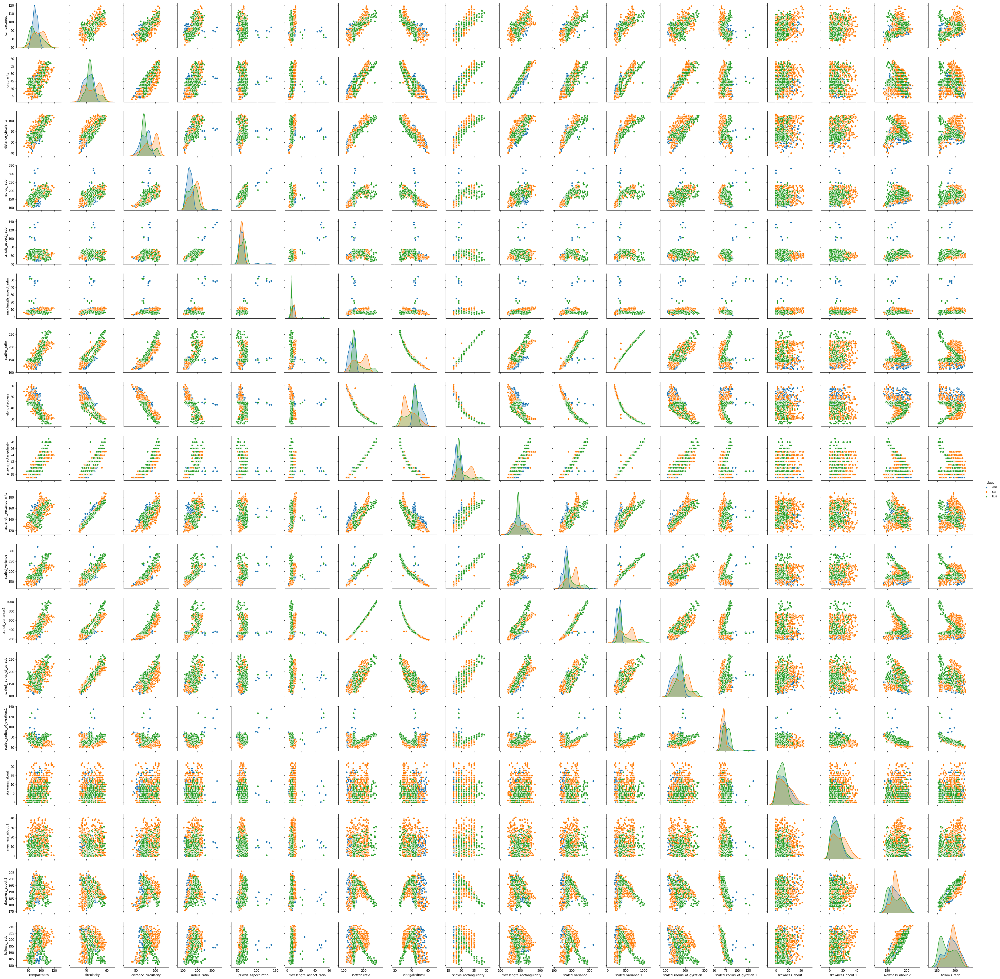

In [12]:

sns.pairplot(df,diag_kind='kde', hue="class")


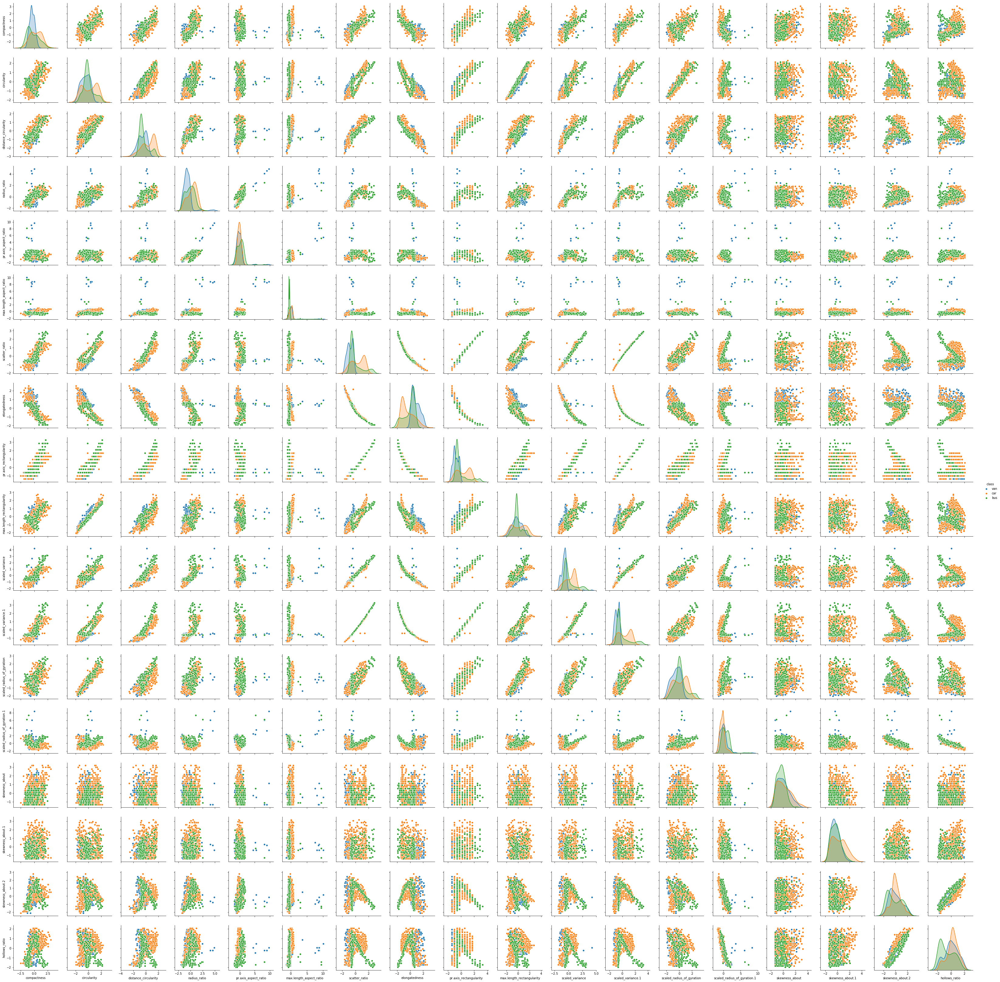

In [13]:
sns.pairplot(df_f,diag_kind='kde', hue="class")

In [14]:
df=df_f

compactness                       AxesSubplot(0.125,0.749828;0.168478x0.130172)
circularity                    AxesSubplot(0.327174,0.749828;0.168478x0.130172)
distance_circularity           AxesSubplot(0.529348,0.749828;0.168478x0.130172)
radius_ratio                   AxesSubplot(0.731522,0.749828;0.168478x0.130172)
pr.axis_aspect_ratio              AxesSubplot(0.125,0.593621;0.168478x0.130172)
max.length_aspect_ratio        AxesSubplot(0.327174,0.593621;0.168478x0.130172)
scatter_ratio                  AxesSubplot(0.529348,0.593621;0.168478x0.130172)
elongatedness                  AxesSubplot(0.731522,0.593621;0.168478x0.130172)
pr.axis_rectangularity            AxesSubplot(0.125,0.437414;0.168478x0.130172)
max.length_rectangularity      AxesSubplot(0.327174,0.437414;0.168478x0.130172)
scaled_variance                AxesSubplot(0.529348,0.437414;0.168478x0.130172)
scaled_variance.1              AxesSubplot(0.731522,0.437414;0.168478x0.130172)
scaled_radius_of_gyration         AxesSu

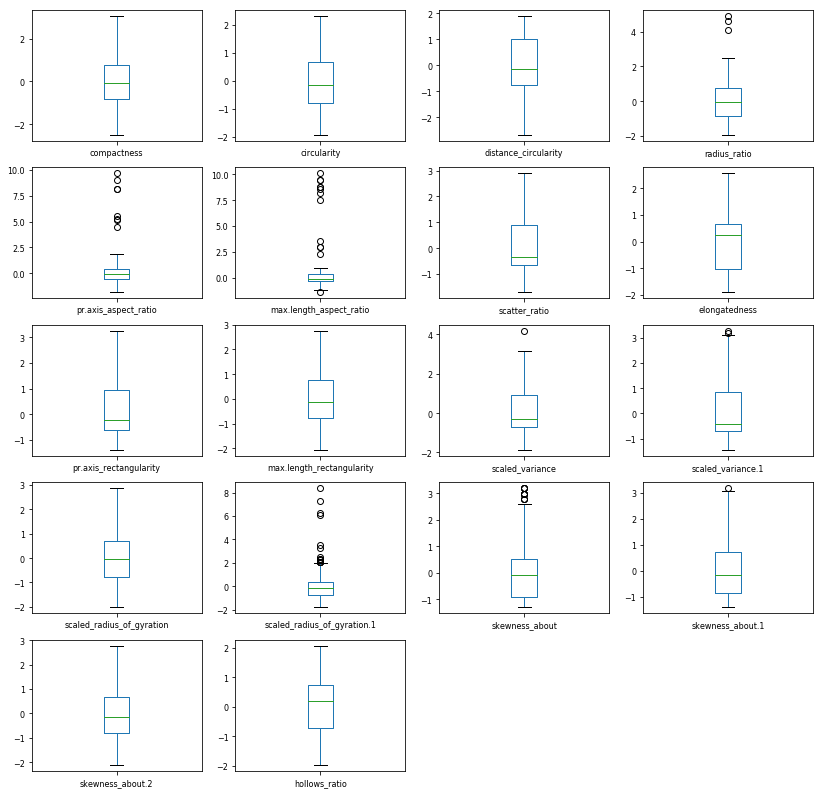

In [15]:
df.plot(kind='box', subplots=True, layout=(5,4), fontsize=8, figsize=(14,14))
plt.show()

There are outliers in radius_ratio, pr.axis_aspect_ratio, max_length_aspect_ratio, scaled_variance, scaled_variance.1, scaled_radius_of_gyration.1, skewness_about and skewness_about.1

<function matplotlib.pyplot.show(*args, **kw)>

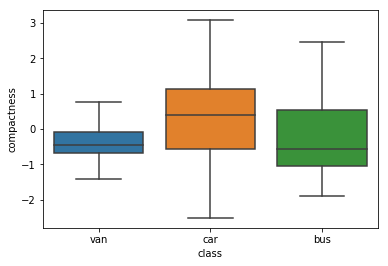

In [16]:
sns.boxplot(x="class", y="compactness",data=df)
plt.show


<function matplotlib.pyplot.show(*args, **kw)>

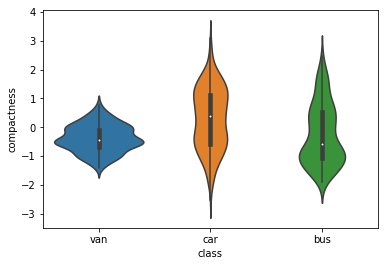

In [17]:

sns.violinplot(x="class",y="compactness",data=df,size=8)
plt.show

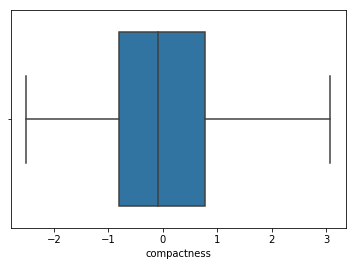

In [18]:
sns.boxplot(x=df['compactness'])

Text(0.5, 0, 'compactness')

Text(0, 0.5, 'class')

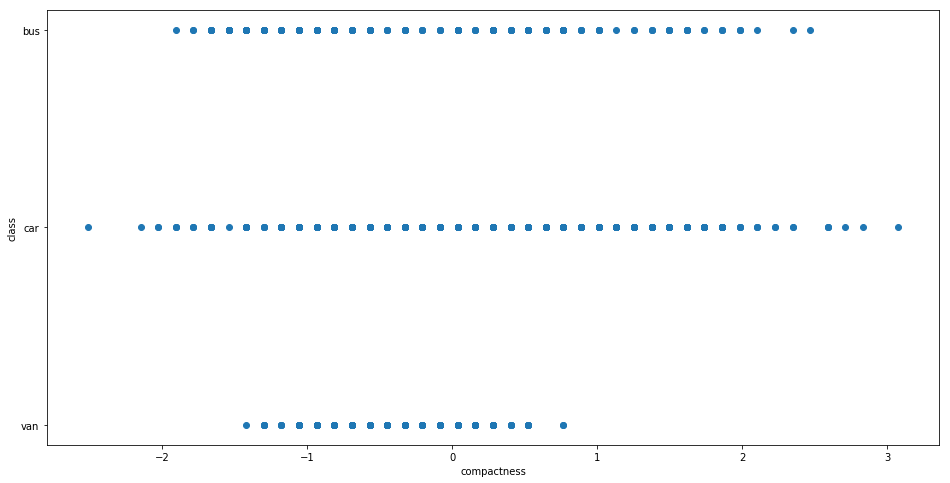

In [19]:
fig, ax = plt.subplots(figsize=(16,8))
ax.scatter(df['compactness'], df['class'])
ax.set_xlabel('compactness')
ax.set_ylabel('class')
plt.show()

<function matplotlib.pyplot.show(*args, **kw)>

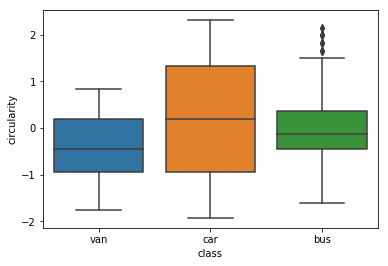

In [20]:
sns.boxplot(x="class", y="circularity",data=df)
plt.show




outliers could be there in bus class for circularity

<function matplotlib.pyplot.show(*args, **kw)>

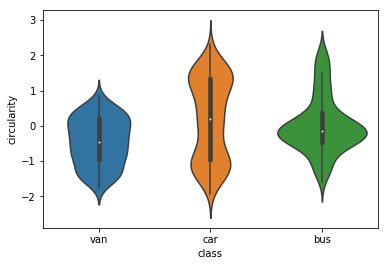

In [21]:

sns.violinplot(x="class",y="circularity",data=df,size=8)
plt.show

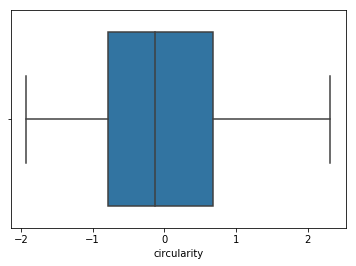

In [22]:
sns.boxplot(x=df['circularity'])

Text(0.5, 0, 'circularity')

Text(0, 0.5, 'class')

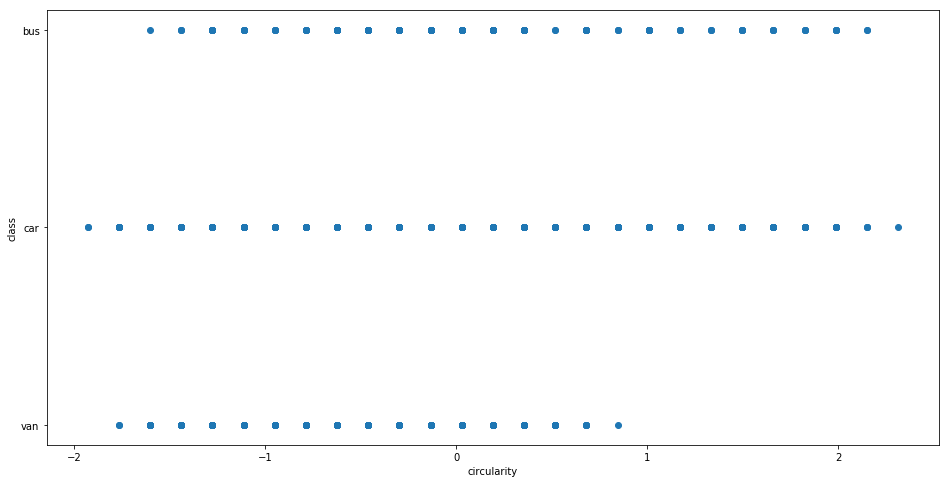

In [23]:
fig, ax = plt.subplots(figsize=(16,8))
ax.scatter(df['circularity'], df['class'])
ax.set_xlabel('circularity')
ax.set_ylabel('class')
plt.show()

<function matplotlib.pyplot.show(*args, **kw)>

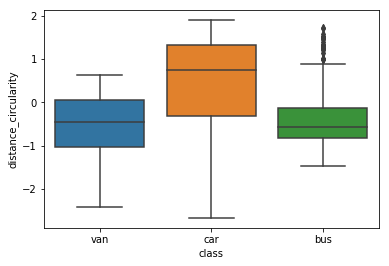

In [24]:
sns.boxplot(x="class", y="distance_circularity",data=df)
plt.show




outliers could be there in bus class for distance_circularity

<function matplotlib.pyplot.show(*args, **kw)>

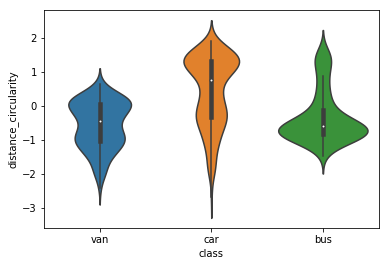

In [25]:

sns.violinplot(x="class",y="distance_circularity",data=df,size=8)
plt.show

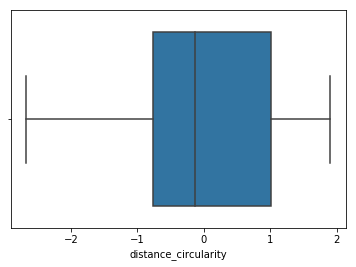

In [26]:
sns.boxplot(x=df['distance_circularity'])

Text(0.5, 0, 'distance_circularity')

Text(0, 0.5, 'class')

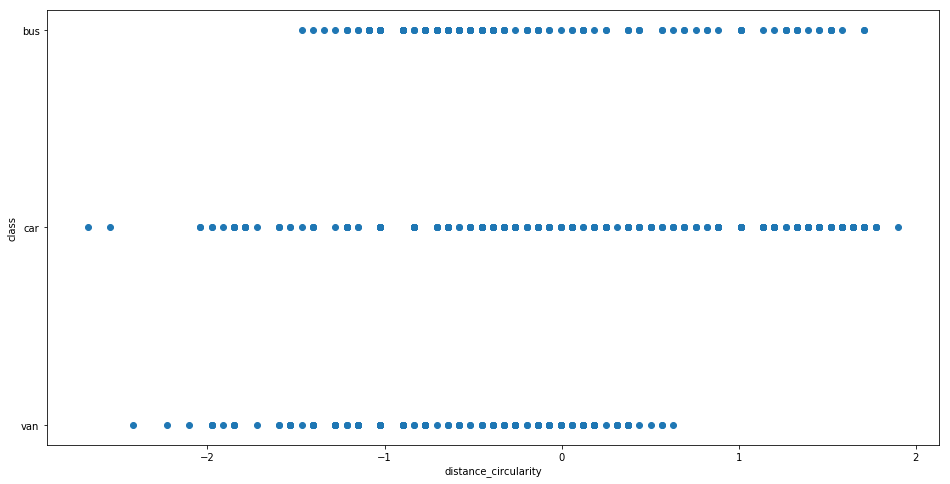

In [27]:
fig, ax = plt.subplots(figsize=(16,8))
ax.scatter(df['distance_circularity'], df['class'])
ax.set_xlabel('distance_circularity')
ax.set_ylabel('class')
plt.show()

<function matplotlib.pyplot.show(*args, **kw)>

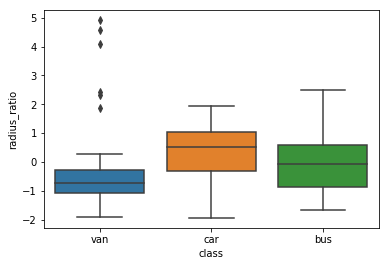

In [28]:
sns.boxplot(x="class", y="radius_ratio",data=df)
plt.show




outliers could be there in van class for radius_ratio

<function matplotlib.pyplot.show(*args, **kw)>

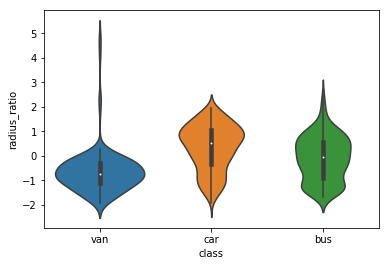

In [29]:

sns.violinplot(x="class",y="radius_ratio",data=df,size=8)
plt.show

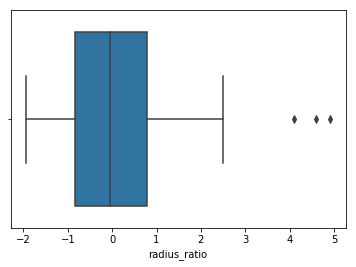

In [30]:
sns.boxplot(x=df['radius_ratio'])

outliers are there in radius_ratio could be coming from van class

Text(0.5, 0, 'radius_ratio')

Text(0, 0.5, 'class')

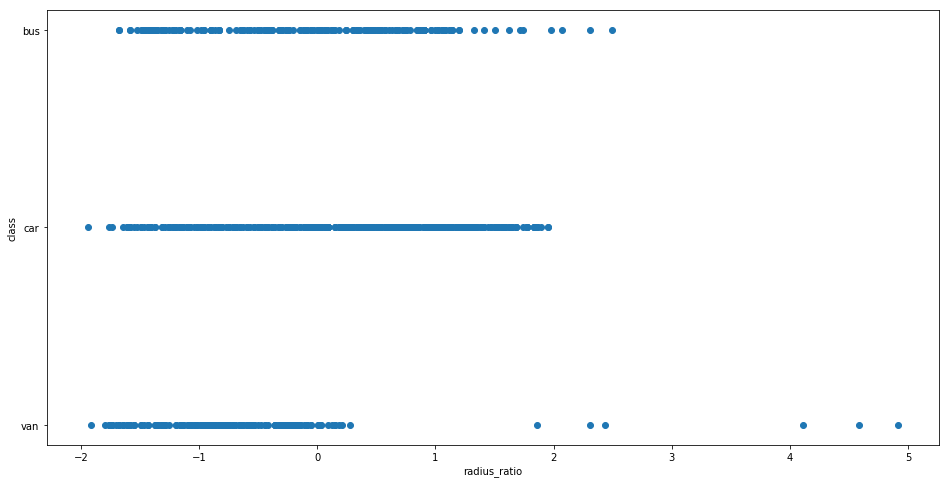

In [31]:
fig, ax = plt.subplots(figsize=(16,8))
ax.scatter(df['radius_ratio'], df['class'])
ax.set_xlabel('radius_ratio')
ax.set_ylabel('class')
plt.show()

outliers are there in radius_ratio could be coming from van class

<function matplotlib.pyplot.show(*args, **kw)>

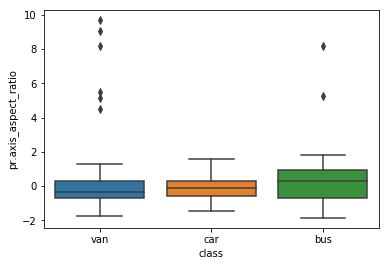

In [32]:
sns.boxplot(x="class", y="pr.axis_aspect_ratio",data=df)
plt.show




outliers could be there in bus and van class for pr.axis_aspect_ratio

<function matplotlib.pyplot.show(*args, **kw)>

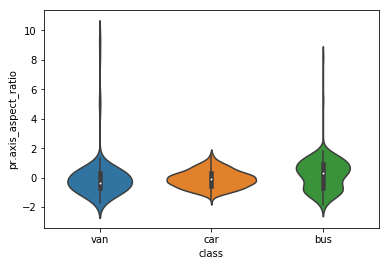

In [33]:

sns.violinplot(x="class",y="pr.axis_aspect_ratio",data=df,size=8)
plt.show

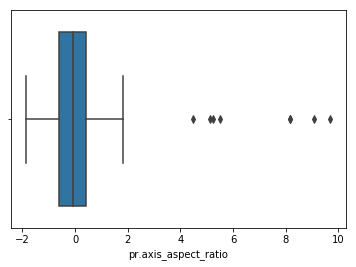

In [34]:
sns.boxplot(x=df['pr.axis_aspect_ratio'])

outliers are there in pr.axis_aspect_ratio could be coming from van and bus class

Text(0.5, 0, 'pr.axis_aspect_ratio')

Text(0, 0.5, 'class')

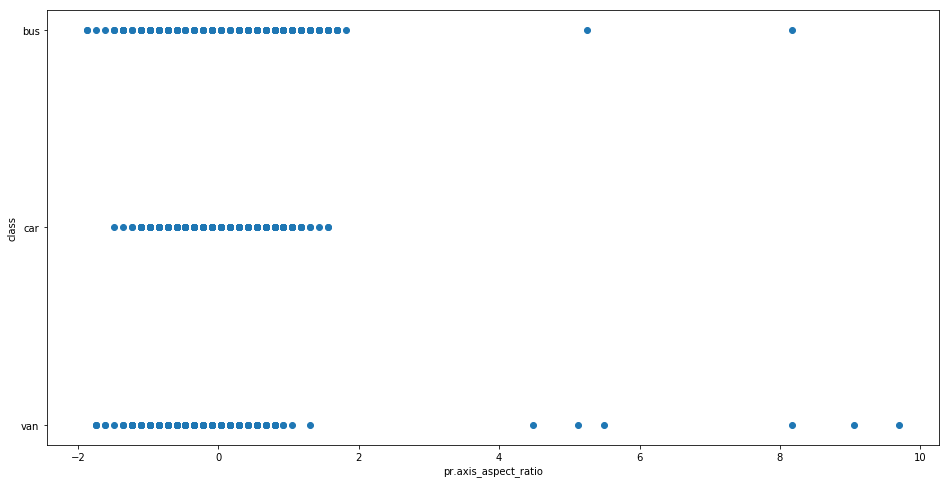

In [35]:
fig, ax = plt.subplots(figsize=(16,8))
ax.scatter(df['pr.axis_aspect_ratio'], df['class'])
ax.set_xlabel('pr.axis_aspect_ratio')
ax.set_ylabel('class')
plt.show()

outliers are there in pr.axis_aspect_ratio could be coming from van and bus class

<function matplotlib.pyplot.show(*args, **kw)>

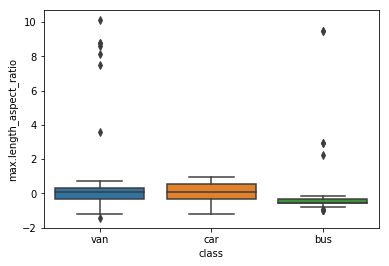

In [36]:
sns.boxplot(x="class", y="max.length_aspect_ratio",data=df)
plt.show




outliers are there in max.length_aspect_ratio coming from van and bus class

<function matplotlib.pyplot.show(*args, **kw)>

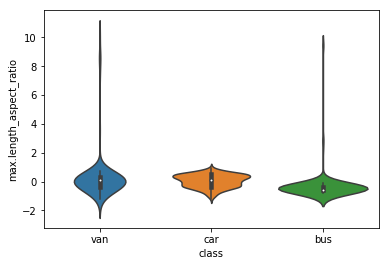

In [37]:

sns.violinplot(x="class",y="max.length_aspect_ratio",data=df,size=8)
plt.show

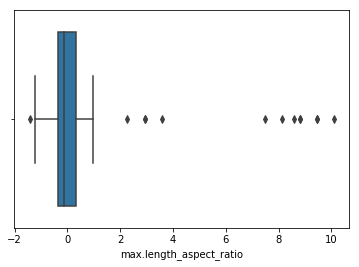

In [38]:
sns.boxplot(x=df['max.length_aspect_ratio'])

outliers are there in max.length_aspect_ratio coming from van and bus class

Text(0.5, 0, 'max.length_aspect_ratio')

Text(0, 0.5, 'class')

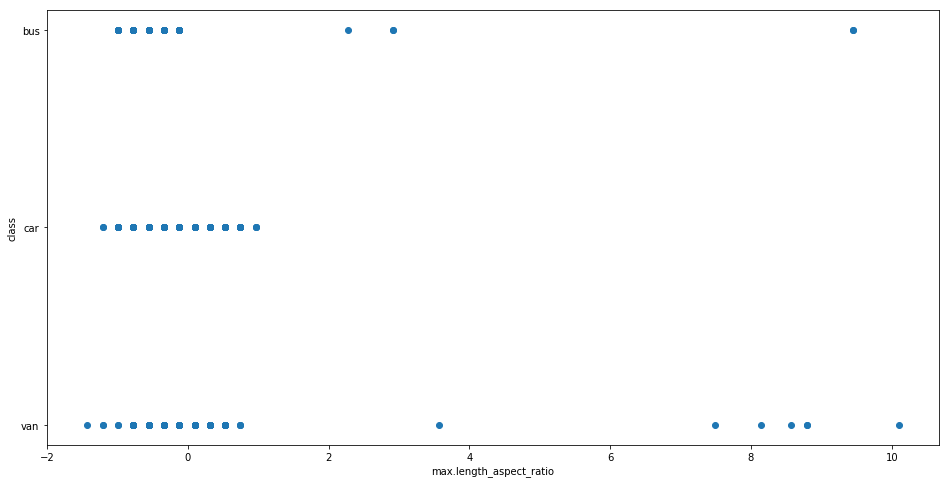

In [39]:
fig, ax = plt.subplots(figsize=(16,8))
ax.scatter(df['max.length_aspect_ratio'], df['class'])
ax.set_xlabel('max.length_aspect_ratio')
ax.set_ylabel('class')
plt.show()

<function matplotlib.pyplot.show(*args, **kw)>

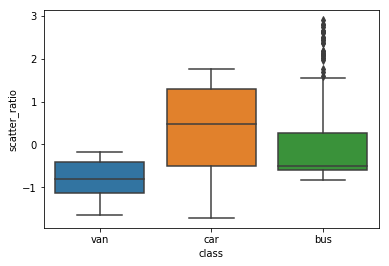

In [40]:
sns.boxplot(x="class", y="scatter_ratio",data=df)
plt.show




outliers are there in bus class for scatter_ratio

<function matplotlib.pyplot.show(*args, **kw)>

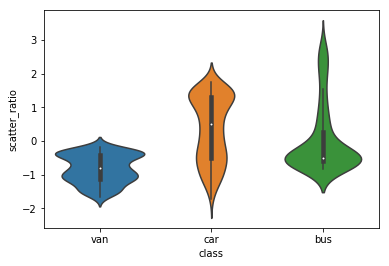

In [41]:

sns.violinplot(x="class",y="scatter_ratio",data=df,size=8)
plt.show

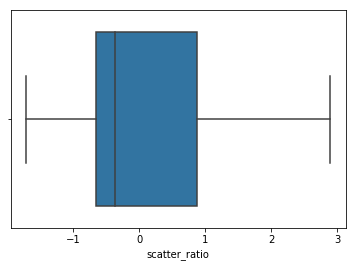

In [42]:
sns.boxplot(x=df['scatter_ratio'])

Text(0.5, 0, 'scatter_ratio')

Text(0, 0.5, 'class')

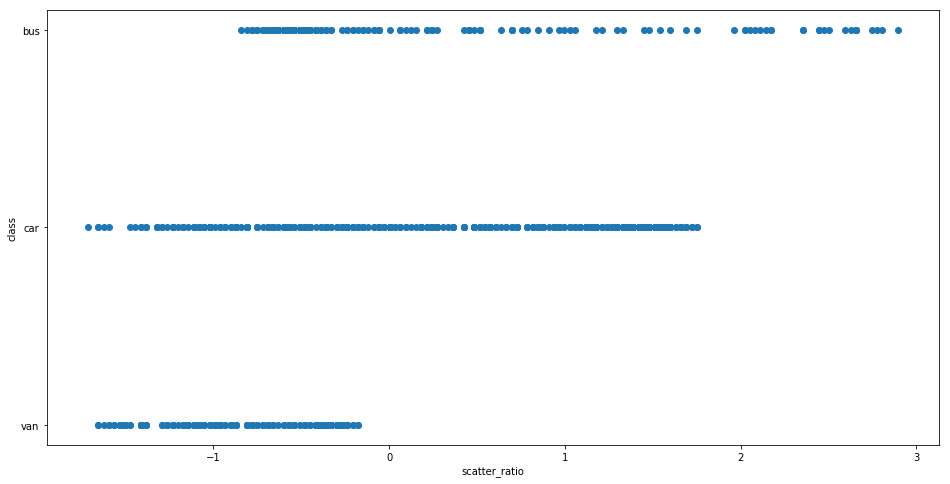

In [43]:
fig, ax = plt.subplots(figsize=(16,8))
ax.scatter(df['scatter_ratio'], df['class'])
ax.set_xlabel('scatter_ratio')
ax.set_ylabel('class')
plt.show()

<function matplotlib.pyplot.show(*args, **kw)>

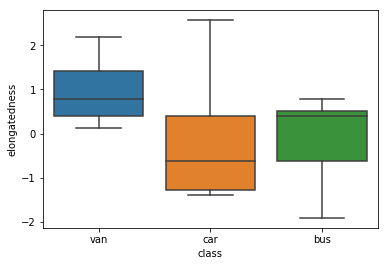

In [44]:
sns.boxplot(x="class", y="elongatedness",data=df)
plt.show




<function matplotlib.pyplot.show(*args, **kw)>

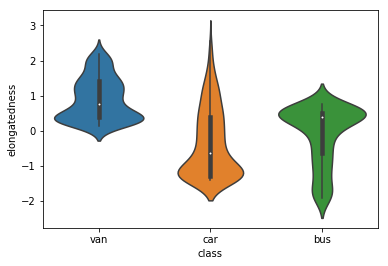

In [45]:

sns.violinplot(x="class",y="elongatedness",data=df,size=8)
plt.show

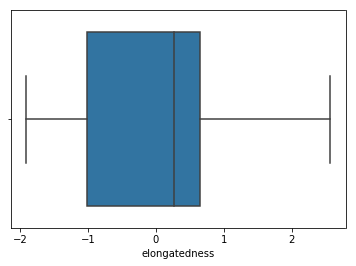

In [46]:
sns.boxplot(x=df['elongatedness'])

Text(0.5, 0, 'elongatedness')

Text(0, 0.5, 'class')

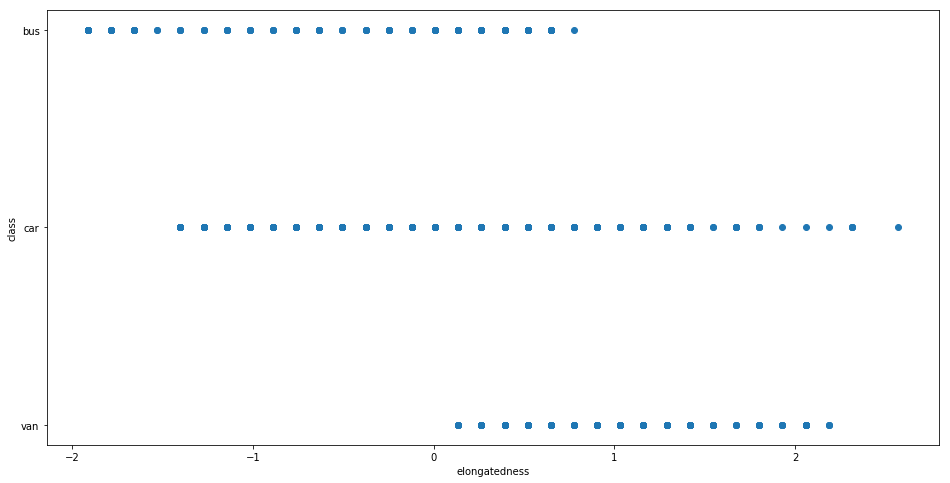

In [47]:
fig, ax = plt.subplots(figsize=(16,8))
ax.scatter(df['elongatedness'], df['class'])
ax.set_xlabel('elongatedness')
ax.set_ylabel('class')
plt.show()

<function matplotlib.pyplot.show(*args, **kw)>

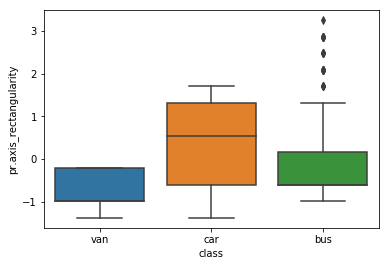

In [48]:
sns.boxplot(x="class", y="pr.axis_rectangularity",data=df)
plt.show




outliers could be there in bus class for pr.axis_rectangularity

<function matplotlib.pyplot.show(*args, **kw)>

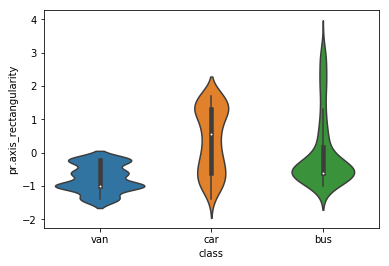

In [49]:

sns.violinplot(x="class",y="pr.axis_rectangularity",data=df,size=8)
plt.show

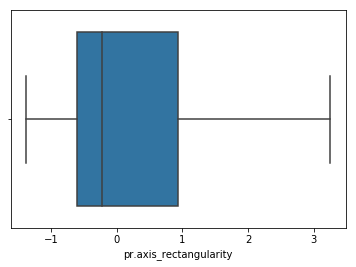

In [50]:
sns.boxplot(x=df['pr.axis_rectangularity'])

Text(0.5, 0, 'pr.axis_rectangularity')

Text(0, 0.5, 'class')

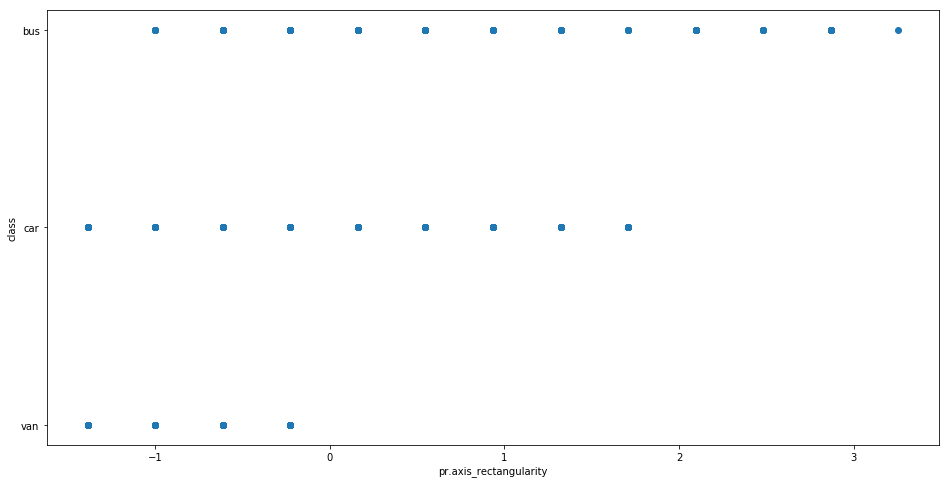

In [51]:
fig, ax = plt.subplots(figsize=(16,8))
ax.scatter(df['pr.axis_rectangularity'], df['class'])
ax.set_xlabel('pr.axis_rectangularity')
ax.set_ylabel('class')
plt.show()

<function matplotlib.pyplot.show(*args, **kw)>

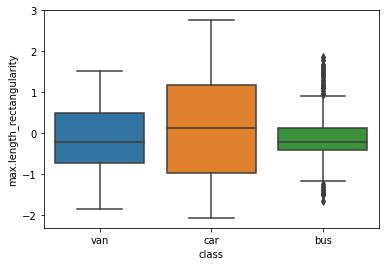

In [52]:
sns.boxplot(x="class", y="max.length_rectangularity",data=df)
plt.show




outliers could be there in bus class for max.length_rectangularity

<function matplotlib.pyplot.show(*args, **kw)>

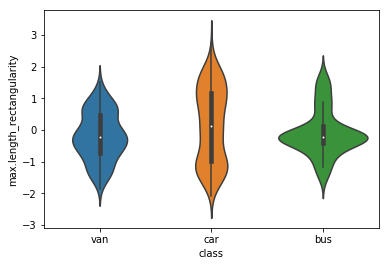

In [53]:

sns.violinplot(x="class",y="max.length_rectangularity",data=df,size=8)
plt.show

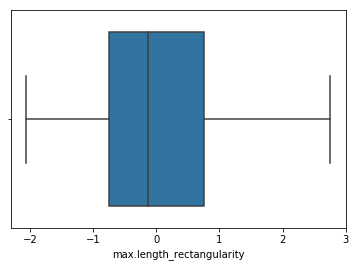

In [54]:
sns.boxplot(x=df['max.length_rectangularity'])

Text(0.5, 0, 'max.length_rectangularity')

Text(0, 0.5, 'class')

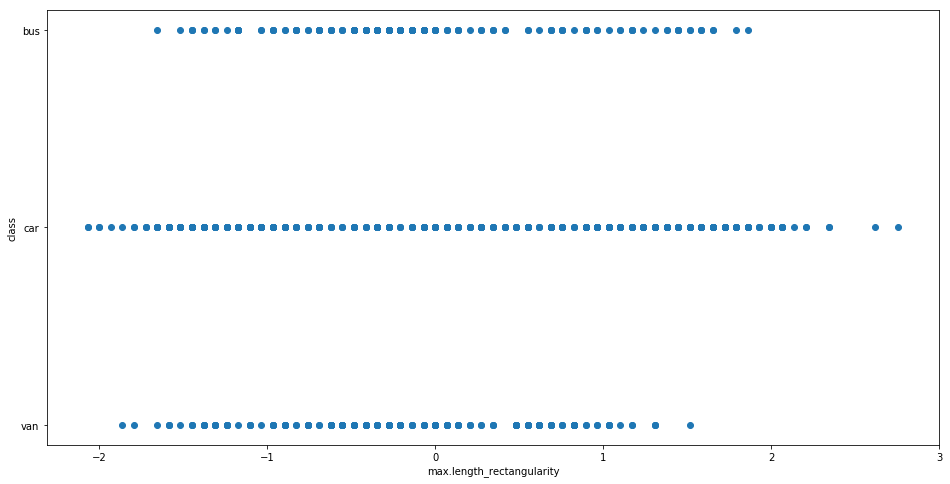

In [55]:
fig, ax = plt.subplots(figsize=(16,8))
ax.scatter(df['max.length_rectangularity'], df['class'])
ax.set_xlabel('max.length_rectangularity')
ax.set_ylabel('class')
plt.show()

<function matplotlib.pyplot.show(*args, **kw)>

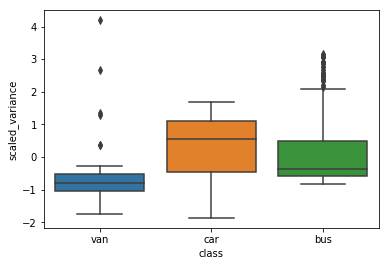

In [56]:
sns.boxplot(x="class", y="scaled_variance",data=df)
plt.show




outliers could be there in bus and van class for scaled_variance

<function matplotlib.pyplot.show(*args, **kw)>

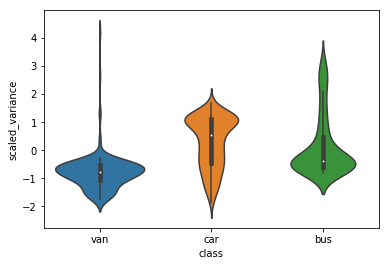

In [57]:

sns.violinplot(x="class",y="scaled_variance",data=df,size=8)
plt.show

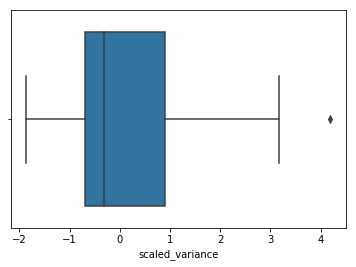

In [58]:
sns.boxplot(x=df['scaled_variance'])

Text(0.5, 0, 'scaled_variance')

Text(0, 0.5, 'class')

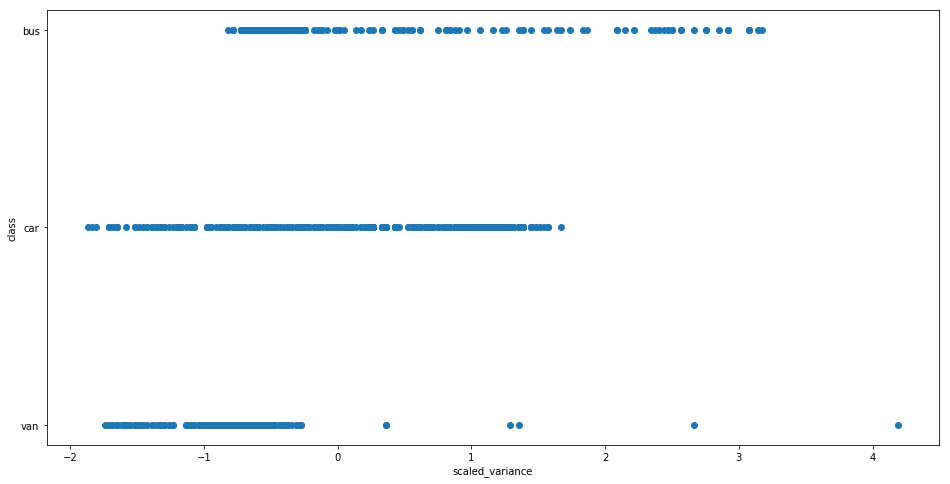

In [59]:
fig, ax = plt.subplots(figsize=(16,8))
ax.scatter(df['scaled_variance'], df['class'])
ax.set_xlabel('scaled_variance')
ax.set_ylabel('class')
plt.show()

outliers could be there in bus class for scaled_variance

<function matplotlib.pyplot.show(*args, **kw)>

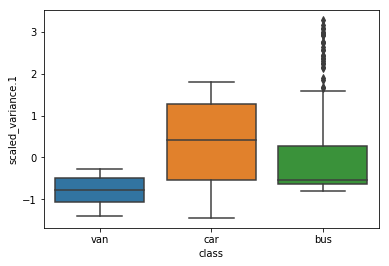

In [60]:
sns.boxplot(x="class", y="scaled_variance.1",data=df)
plt.show




outliers could be there in bus class for scaled_variance.1

<function matplotlib.pyplot.show(*args, **kw)>

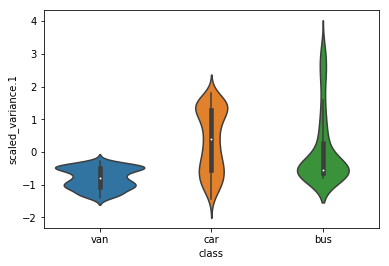

In [61]:

sns.violinplot(x="class",y="scaled_variance.1",data=df,size=8)
plt.show

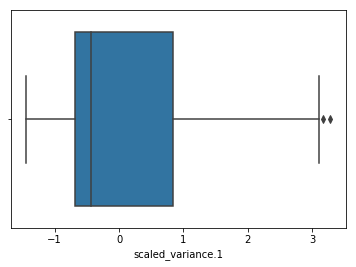

In [62]:
sns.boxplot(x=df['scaled_variance.1'])

outliers are there could be coming in from scaled_variance.1

Text(0.5, 0, 'scaled_variance.1')

Text(0, 0.5, 'class')

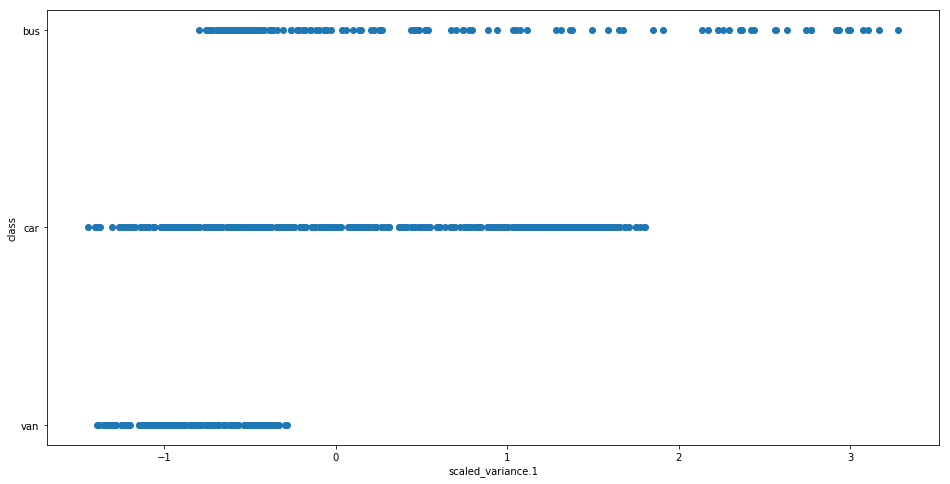

In [63]:
fig, ax = plt.subplots(figsize=(16,8))
ax.scatter(df['scaled_variance.1'], df['class'])
ax.set_xlabel('scaled_variance.1')
ax.set_ylabel('class')
plt.show()

<function matplotlib.pyplot.show(*args, **kw)>

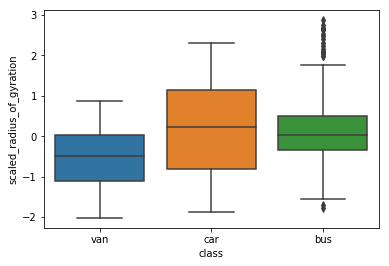

In [64]:
sns.boxplot(x="class", y="scaled_radius_of_gyration",data=df)
plt.show




outliers could be there in bus class for scaled_radius_of_gyration

<function matplotlib.pyplot.show(*args, **kw)>

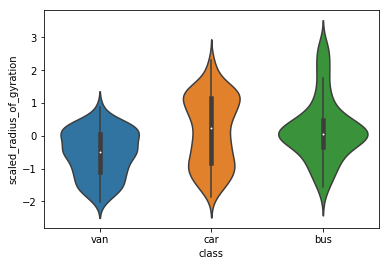

In [65]:

sns.violinplot(x="class",y="scaled_radius_of_gyration",data=df,size=8)
plt.show

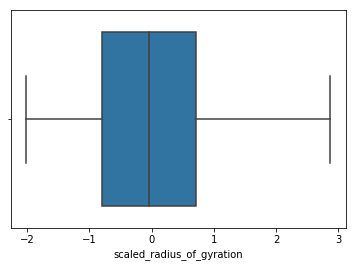

In [66]:
sns.boxplot(x=df['scaled_radius_of_gyration'])

Text(0.5, 0, 'scaled_radius_of_gyration')

Text(0, 0.5, 'class')

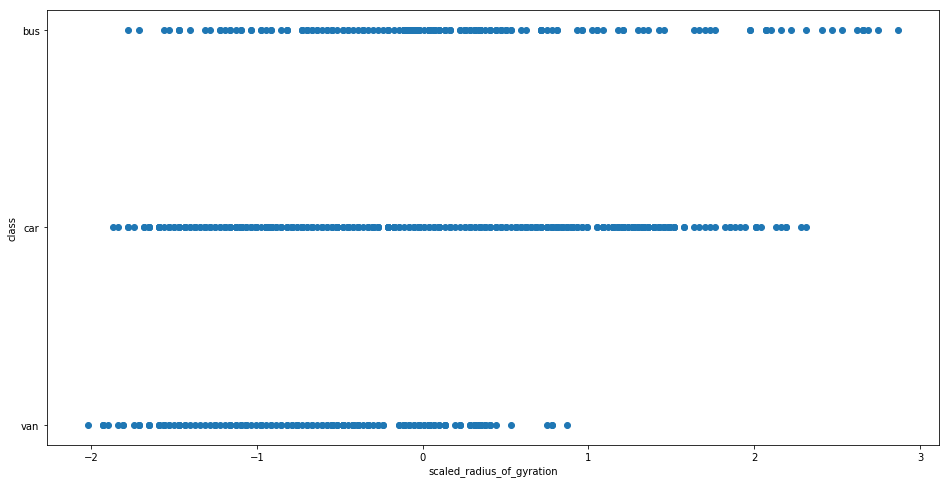

In [67]:
fig, ax = plt.subplots(figsize=(16,8))
ax.scatter(df['scaled_radius_of_gyration'], df['class'])
ax.set_xlabel('scaled_radius_of_gyration')
ax.set_ylabel('class')
plt.show()

<function matplotlib.pyplot.show(*args, **kw)>

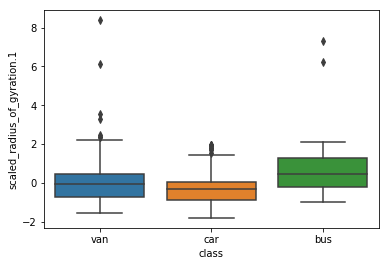

In [68]:
sns.boxplot(x="class", y="scaled_radius_of_gyration.1",data=df)
plt.show




outliers are there in bus and bus class for scaled_radius_of_gyration.1

<function matplotlib.pyplot.show(*args, **kw)>

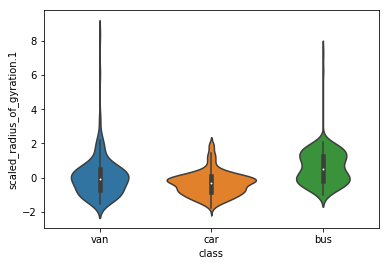

In [69]:

sns.violinplot(x="class",y="scaled_radius_of_gyration.1",data=df,size=8)
plt.show

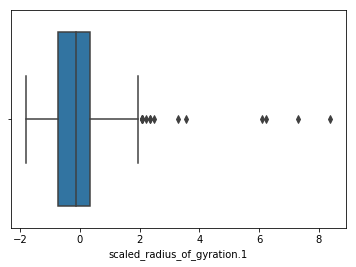

In [70]:
sns.boxplot(x=df['scaled_radius_of_gyration.1'])

outliers are there could be coming from bus class

Text(0.5, 0, 'scaled_radius_of_gyration.1')

Text(0, 0.5, 'class')

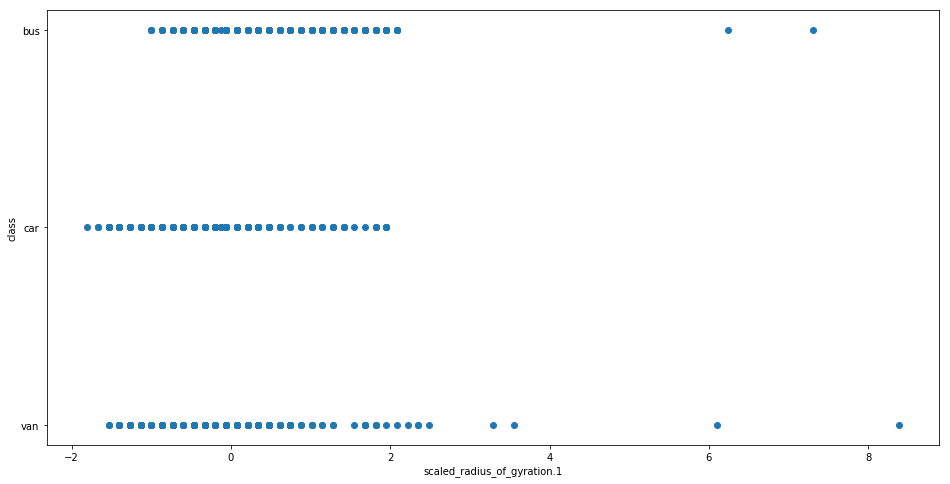

In [71]:
fig, ax = plt.subplots(figsize=(16,8))
ax.scatter(df['scaled_radius_of_gyration.1'], df['class'])
ax.set_xlabel('scaled_radius_of_gyration.1')
ax.set_ylabel('class')
plt.show()

outliers are there could be coming from bus class

<function matplotlib.pyplot.show(*args, **kw)>

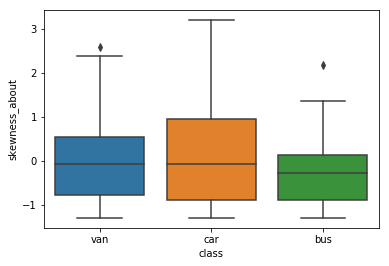

In [72]:
sns.boxplot(x="class", y="skewness_about",data=df)
plt.show




<function matplotlib.pyplot.show(*args, **kw)>

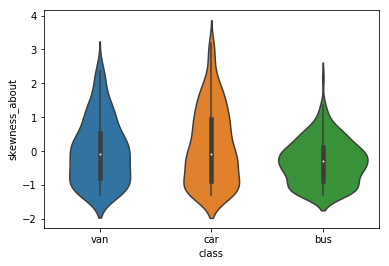

In [73]:

sns.violinplot(x="class",y="skewness_about",data=df,size=8)
plt.show

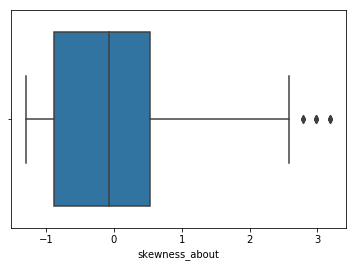

In [74]:
sns.boxplot(x=df['skewness_about'])

outliers are there could be coming from bus class

Text(0.5, 0, 'skewness_about')

Text(0, 0.5, 'class')

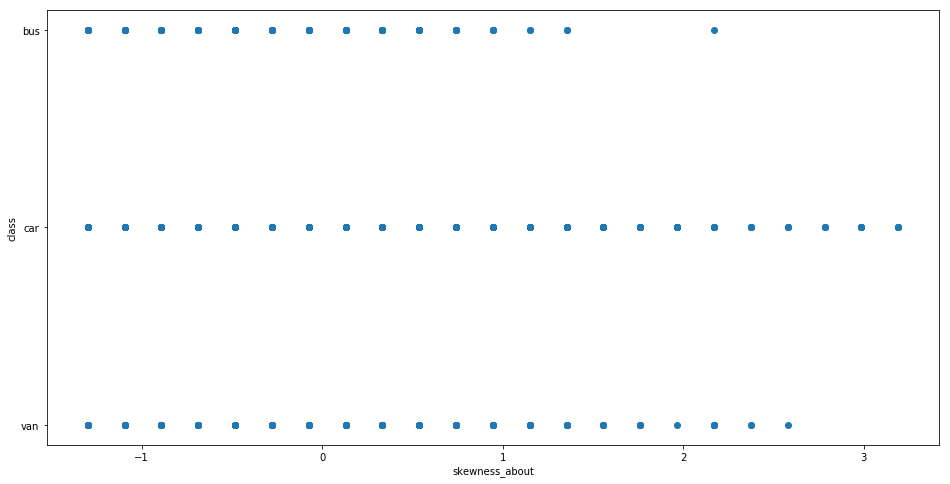

In [75]:
fig, ax = plt.subplots(figsize=(16,8))
ax.scatter(df['skewness_about'], df['class'])
ax.set_xlabel('skewness_about')
ax.set_ylabel('class')
plt.show()

<function matplotlib.pyplot.show(*args, **kw)>

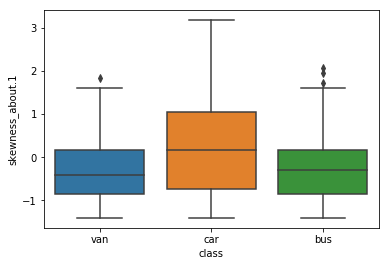

In [76]:
sns.boxplot(x="class", y="skewness_about.1",data=df)
plt.show




<function matplotlib.pyplot.show(*args, **kw)>

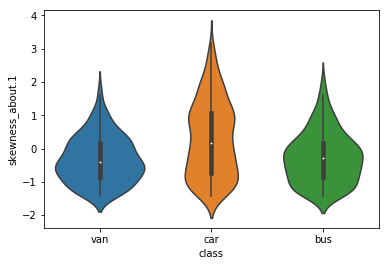

In [77]:

sns.violinplot(x="class",y="skewness_about.1",data=df,size=8)
plt.show

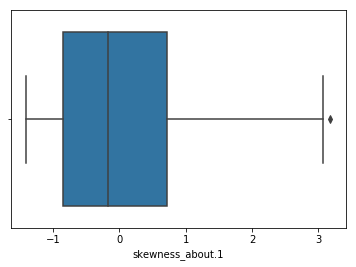

In [78]:
sns.boxplot(x=df['skewness_about.1'])

Text(0.5, 0, 'skewness_about.1')

Text(0, 0.5, 'class')

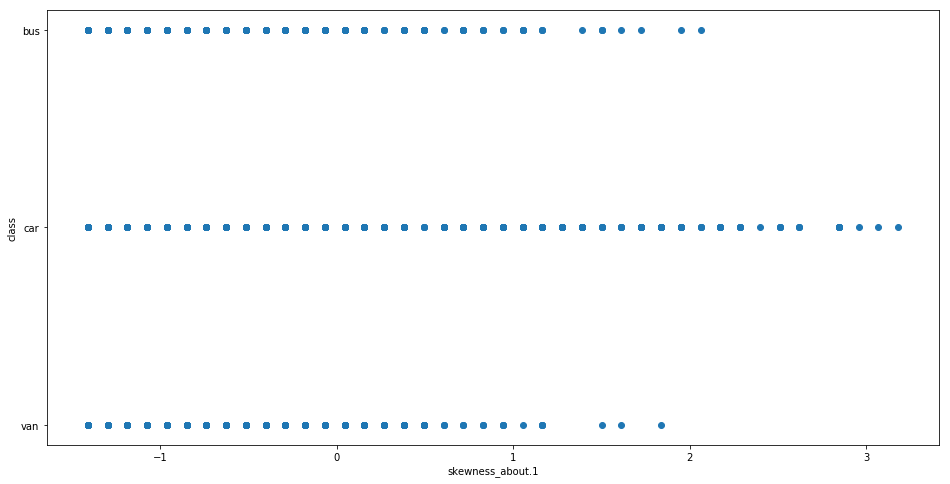

In [79]:
fig, ax = plt.subplots(figsize=(16,8))
ax.scatter(df['skewness_about.1'], df['class'])
ax.set_xlabel('skewness_about.1')
ax.set_ylabel('class')
plt.show()

<function matplotlib.pyplot.show(*args, **kw)>

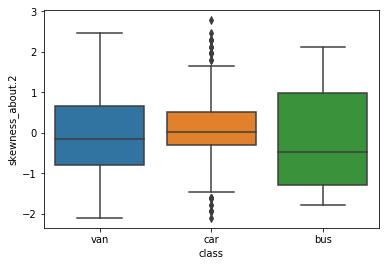

In [80]:
sns.boxplot(x="class", y="skewness_about.2",data=df)
plt.show




<function matplotlib.pyplot.show(*args, **kw)>

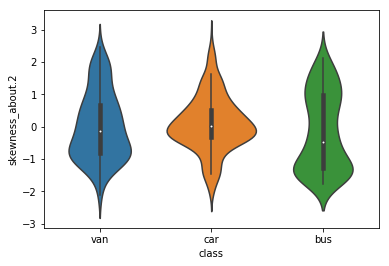

In [81]:

sns.violinplot(x="class",y="skewness_about.2",data=df,size=8)
plt.show

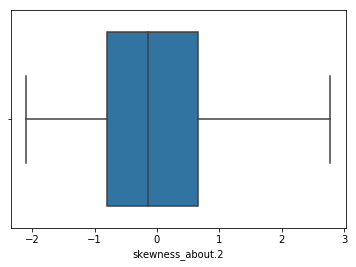

In [82]:
sns.boxplot(x=df['skewness_about.2'])

Text(0.5, 0, 'skewness_about.2')

Text(0, 0.5, 'class')

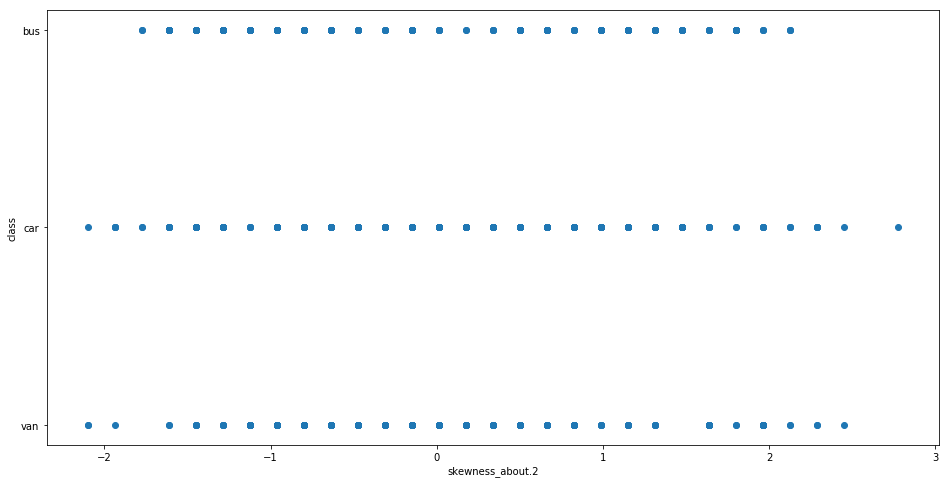

In [83]:
fig, ax = plt.subplots(figsize=(16,8))
ax.scatter(df['skewness_about.2'], df['class'])
ax.set_xlabel('skewness_about.2')
ax.set_ylabel('class')
plt.show()

<function matplotlib.pyplot.show(*args, **kw)>

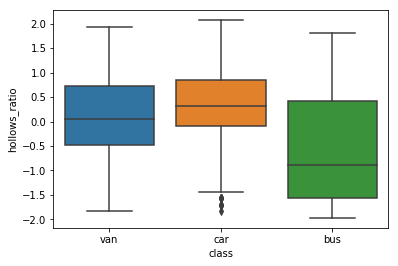

In [84]:
sns.boxplot(x="class", y="hollows_ratio",data=df)
plt.show




<function matplotlib.pyplot.show(*args, **kw)>

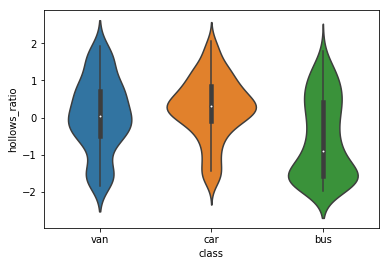

In [85]:

sns.violinplot(x="class",y="hollows_ratio",data=df,size=8)
plt.show

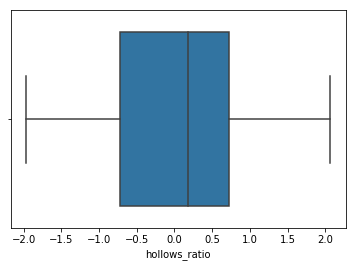

In [86]:
sns.boxplot(x=df['hollows_ratio'])

Text(0.5, 0, 'hollows_ratio')

Text(0, 0.5, 'class')

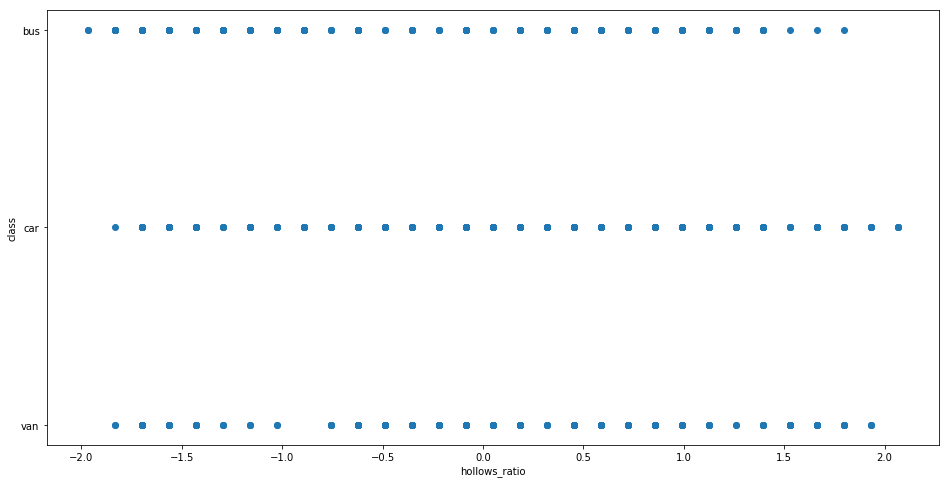

In [87]:
fig, ax = plt.subplots(figsize=(16,8))
ax.scatter(df['hollows_ratio'], df['class'])
ax.set_xlabel('hollows_ratio')
ax.set_ylabel('class')
plt.show()

In [88]:
df.shape

(846, 19)

In [89]:
df_Z_O = df[(np.abs(stats.zscore(df.select_dtypes(exclude='object'))) < 3).all(axis=1)]

In [90]:

df_Z_O.shape
df_Z_O.dtypes

(824, 19)

compactness                    float64
circularity                    float64
distance_circularity           float64
radius_ratio                   float64
pr.axis_aspect_ratio           float64
max.length_aspect_ratio        float64
scatter_ratio                  float64
elongatedness                  float64
pr.axis_rectangularity         float64
max.length_rectangularity      float64
scaled_variance                float64
scaled_variance.1              float64
scaled_radius_of_gyration      float64
scaled_radius_of_gyration.1    float64
skewness_about                 float64
skewness_about.1               float64
skewness_about.2               float64
hollows_ratio                  float64
class                           object
dtype: object

In [91]:
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

compactness                    1.579662
circularity                    1.468035
distance_circularity           1.779782
radius_ratio                   1.617657
pr.axis_aspect_ratio           1.015547
max.length_aspect_ratio        0.652387
scatter_ratio                  1.537159
elongatedness                  1.665116
pr.axis_rectangularity         1.546176
max.length_rectangularity      1.516502
scaled_variance                1.595309
scaled_variance.1              1.522178
scaled_radius_of_gyration      1.506439
scaled_radius_of_gyration.1    1.071766
skewness_about                 1.428471
skewness_about.1               1.568508
skewness_about.2               1.463745
hollows_ratio                  1.445981
dtype: float64


In [92]:
df_IQR_O = df[~((df.select_dtypes(exclude='object') < (Q1 - 1.5 * IQR)) |(df.select_dtypes(exclude='object') > (Q3 + 1.5 * IQR))).any(axis=1)]
df_IQR_O.shape

(813, 19)

In [93]:
df_Z_O.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
compactness,824.0,-0.015790,0.983093,-2.512695,-0.811520,-0.082445,0.768143,2.833855
circularity,824.0,-0.011655,0.994573,-1.928651,-0.786846,-0.134387,0.681188,2.312338
distance_circularity,824.0,-0.010706,0.997085,-2.676060,-0.769150,-0.133514,1.010632,1.900523
radius_ratio,824.0,-0.037328,0.954259,-1.943427,-0.835032,-0.086116,0.752669,2.310413
pr.axis_aspect_ratio,824.0,-0.060560,0.714875,-1.863187,-0.593753,-0.085979,0.421794,1.818171
max.length_aspect_ratio,824.0,-0.088019,0.482775,-1.428157,-0.340845,-0.123383,0.311542,2.921090
scatter_ratio,824.0,-0.015856,0.979236,-1.714617,-0.689844,-0.358300,0.877456,2.655738
elongatedness,824.0,0.010041,0.993773,-1.913112,-1.016511,0.264347,0.648605,2.569893
pr.axis_rectangularity,824.0,-0.017466,0.974706,-1.383974,-0.610886,-0.224342,0.935290,2.868010
max.length_rectangularity,824.0,-0.013973,0.997350,-2.067876,-0.758169,-0.137782,0.758332,2.757358


In [94]:
df_IQR_O.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
compactness,813.0,-0.008013,0.979358,-2.512695,-0.811520,-0.082445,0.768143,2.712343
circularity,813.0,-0.004176,0.996752,-1.928651,-0.786846,-0.134387,0.681188,2.312338
distance_circularity,813.0,0.003465,0.987737,-2.676060,-0.769150,-0.133514,1.010632,1.900523
radius_ratio,813.0,-0.029409,0.945225,-1.943427,-0.835032,-0.056160,0.752669,2.310413
pr.axis_aspect_ratio,813.0,-0.062870,0.714291,-1.863187,-0.593753,-0.085979,0.421794,1.818171
max.length_aspect_ratio,813.0,-0.096902,0.445439,-1.210695,-0.340845,-0.123383,0.311542,0.963929
scatter_ratio,813.0,0.000011,0.988051,-1.714617,-0.659704,-0.358300,0.877456,2.806440
elongatedness,813.0,-0.005688,0.989523,-1.913112,-1.016511,0.264347,0.648605,2.569893
pr.axis_rectangularity,813.0,-0.000878,0.987017,-1.383974,-0.610886,-0.224342,0.935290,2.868010
max.length_rectangularity,813.0,-0.003056,0.998442,-2.067876,-0.758169,-0.137782,0.758332,2.757358


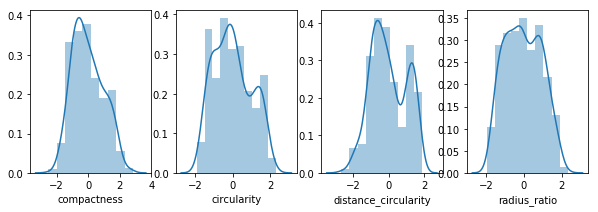

In [95]:
f, ax = plt.subplots(1, 4, figsize=(10,3))
vis1 = sns.distplot(df_Z_O["compactness"],bins=10, ax= ax[0])
vis2 = sns.distplot(df_Z_O["circularity"],bins=10, ax=ax[1])
vis3 = sns.distplot(df_Z_O["distance_circularity"],bins=10, ax= ax[2])
vis4 = sns.distplot(df_Z_O["radius_ratio"],bins=10, ax=ax[3])

f.savefig('subplot.png')


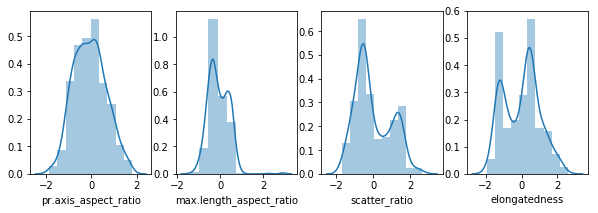

In [96]:
f, ax = plt.subplots(1, 4, figsize=(10,3))
vis1 = sns.distplot(df_Z_O["pr.axis_aspect_ratio"],bins=10, ax= ax[0])
vis2 = sns.distplot(df_Z_O["max.length_aspect_ratio"],bins=10, ax=ax[1])
vis3 = sns.distplot(df_Z_O["scatter_ratio"],bins=10, ax= ax[2])
vis4 = sns.distplot(df_Z_O["elongatedness"],bins=10, ax=ax[3])

f.savefig('subplot.png')

scatter_ratio,elongatedness,max.length_aspect_ratio has multiple gaussian

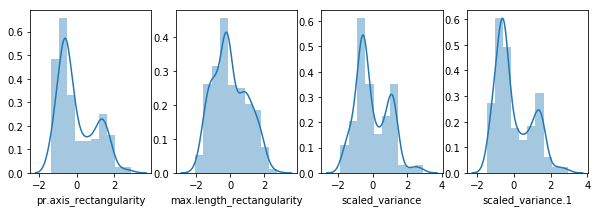

In [97]:
f, ax = plt.subplots(1, 4, figsize=(10,3))
vis1 = sns.distplot(df_Z_O["pr.axis_rectangularity"],bins=10, ax= ax[0])
vis2 = sns.distplot(df_Z_O["max.length_rectangularity"],bins=10, ax=ax[1])
vis3 = sns.distplot(df_Z_O["scaled_variance"],bins=10, ax= ax[2])
vis4 = sns.distplot(df_Z_O["scaled_variance.1"],bins=10, ax=ax[3])


all 4 variables above have multiple gaussian

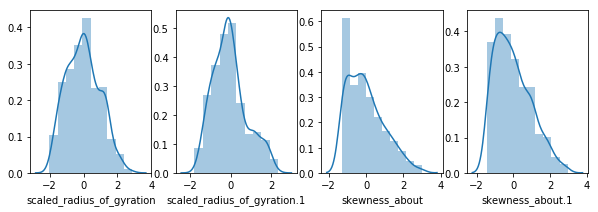

In [98]:
f, ax = plt.subplots(1, 4, figsize=(10,3))
vis1 = sns.distplot(df_Z_O["scaled_radius_of_gyration"],bins=10, ax= ax[0])
vis2 = sns.distplot(df_Z_O["scaled_radius_of_gyration.1"],bins=10, ax=ax[1])
vis3 = sns.distplot(df_Z_O["skewness_about"],bins=10, ax= ax[2])
vis4 = sns.distplot(df_Z_O["skewness_about.1"],bins=10, ax=ax[3])

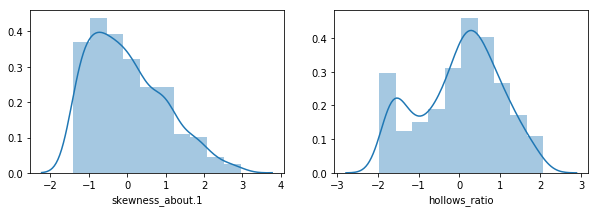

In [99]:
f, ax = plt.subplots(1, 2, figsize=(10,3))

vis1 = sns.distplot(df_Z_O["skewness_about.1"],bins=10, ax= ax[0])
vis2 = sns.distplot(df_Z_O["hollows_ratio"],bins=10, ax=ax[1])


### 2.  Understanding the attributes - Find relationship between different attributes (Independent variables) and choose carefully which all attributes have to be a part of the analysis and why (5 points)

In [100]:
df_Z_O.corr()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
compactness,1.000000,0.681342,0.787265,0.751520,0.216725,0.463299,0.808341,-0.784806,0.809659,0.673168,0.787004,0.810769,0.574045,-0.290926,0.220483,0.159651,0.319205,0.396095
circularity,0.681342,1.000000,0.790750,0.648785,0.219992,0.540388,0.849447,-0.820235,0.846328,0.963278,0.810586,0.839147,0.928799,0.029516,0.144134,-0.012849,-0.090179,0.069606
distance_circularity,0.787265,0.790750,1.000000,0.814325,0.261043,0.627453,0.907589,-0.910044,0.896707,0.771265,0.887844,0.890970,0.701221,-0.281632,0.106128,0.268821,0.160933,0.357251
radius_ratio,0.751520,0.648785,0.814325,1.000000,0.671571,0.444435,0.799315,-0.849293,0.774255,0.585156,0.806227,0.787977,0.558941,-0.427347,0.051435,0.187845,0.434944,0.523614
pr.axis_aspect_ratio,0.216725,0.219992,0.261043,0.671571,1.000000,0.164947,0.224266,-0.320961,0.194809,0.162616,0.245646,0.212601,0.175251,-0.318392,-0.051772,-0.024893,0.402286,0.413536
max.length_aspect_ratio,0.463299,0.540388,0.627453,0.444435,0.164947,1.000000,0.482804,-0.485544,0.481485,0.618196,0.413908,0.446931,0.400439,-0.301369,0.079497,0.140202,0.050040,0.359678
scatter_ratio,0.808341,0.849447,0.907589,0.799315,0.224266,0.482804,1.000000,-0.973064,0.989258,0.809180,0.977432,0.993015,0.791708,-0.045662,0.065916,0.214812,0.028361,0.155959
elongatedness,-0.784806,-0.820235,-0.910044,-0.849293,-0.320961,-0.485544,-0.973064,1.000000,-0.950572,-0.772881,-0.967786,-0.956988,-0.760924,0.129957,-0.046196,-0.186813,-0.133660,-0.245289
pr.axis_rectangularity,0.809659,0.846328,0.896707,0.774255,0.194809,0.481485,0.989258,-0.950572,1.000000,0.812352,0.962712,0.987580,0.788560,-0.030135,0.074722,0.216954,0.004102,0.137688
max.length_rectangularity,0.673168,0.963278,0.771265,0.585156,0.162616,0.618196,0.809180,-0.772881,0.812352,1.000000,0.753034,0.796291,0.866557,0.011939,0.133499,0.002437,-0.089624,0.099819


(<Figure size 1440x1440 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x2a6bff3c668>)

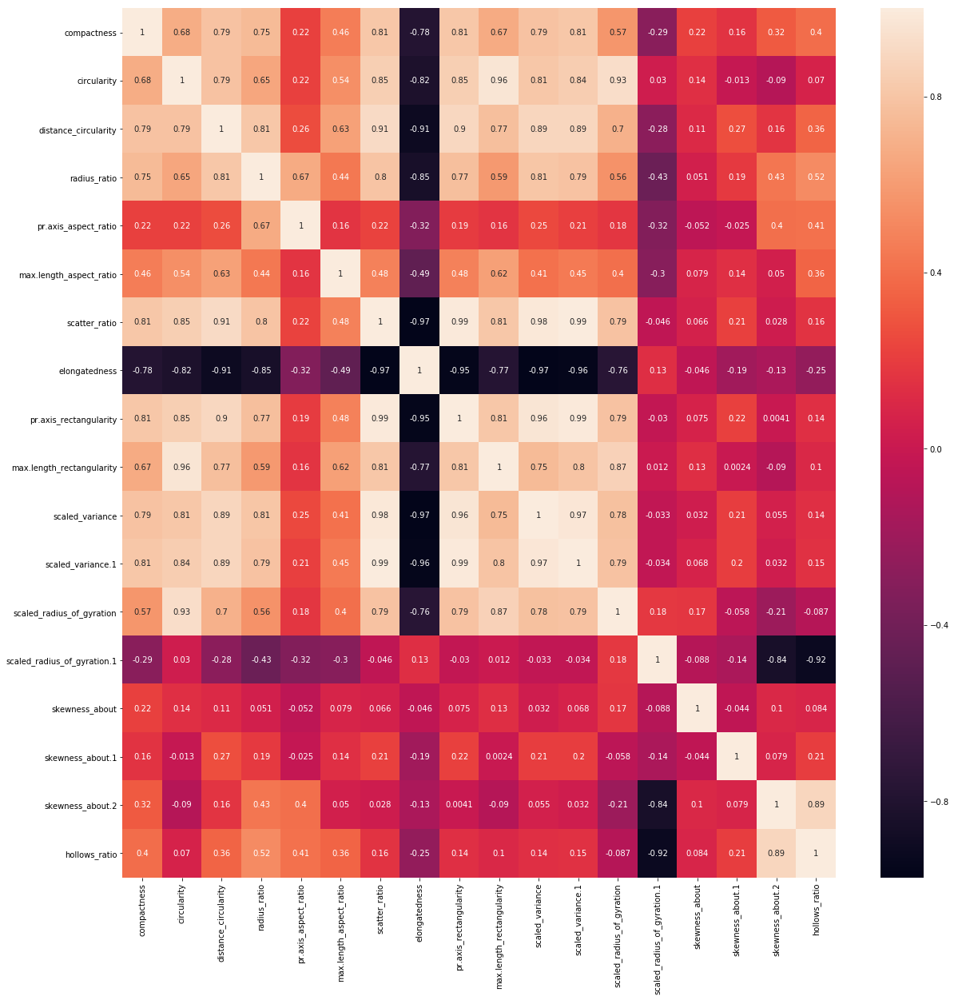

In [101]:
corrmat = df_Z_O.corr()
plt.subplots(figsize = (20,20))
sns.heatmap(corrmat, annot=True)

Elongatedness have good corelation with other independent attributes.

In [102]:
df_Z_O.select_dtypes(exclude='object').var() > 0.1


compactness                    True
circularity                    True
distance_circularity           True
radius_ratio                   True
pr.axis_aspect_ratio           True
max.length_aspect_ratio        True
scatter_ratio                  True
elongatedness                  True
pr.axis_rectangularity         True
max.length_rectangularity      True
scaled_variance                True
scaled_variance.1              True
scaled_radius_of_gyration      True
scaled_radius_of_gyration.1    True
skewness_about                 True
skewness_about.1               True
skewness_about.2               True
hollows_ratio                  True
dtype: bool

all the variables are having variance having >0.1. Going to use all the variables and with PCA analysis I am going to reduce the number of dimensions

In [103]:
df_Z_O['class']=df_Z_O['class'].map({'car':1,'bus':2,'van':3})
df_Z_O.dtypes


C:\Users\rajan\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


compactness                    float64
circularity                    float64
distance_circularity           float64
radius_ratio                   float64
pr.axis_aspect_ratio           float64
max.length_aspect_ratio        float64
scatter_ratio                  float64
elongatedness                  float64
pr.axis_rectangularity         float64
max.length_rectangularity      float64
scaled_variance                float64
scaled_variance.1              float64
scaled_radius_of_gyration      float64
scaled_radius_of_gyration.1    float64
skewness_about                 float64
skewness_about.1               float64
skewness_about.2               float64
hollows_ratio                  float64
class                            int64
dtype: object

In [104]:
X = df_Z_O.iloc[:,0:17]
Y = df_Z_O['class']

In [105]:
X_train_sd = StandardScaler().fit_transform(X)

In [106]:
#get co variance matrix
train_cov_matrix = np.cov(X_train_sd.T)
print('Covariance Matrix \n%s', train_cov_matrix)

Covariance Matrix 
%s [[ 1.00121507  0.68217024  0.78822181  0.75243342  0.21698852  0.46386185
   0.80932301 -0.78575974  0.81064247  0.67398599  0.78796074  0.81175375
   0.57474275 -0.29127966  0.22075084  0.15984485  0.31959319]
 [ 0.68217024  1.00121507  0.79171052  0.64957366  0.22025961  0.541045
   0.85047918 -0.82123179  0.84735643  0.96444884  0.81157051  0.84016678
   0.92992793  0.02955186  0.14430926 -0.01286449 -0.09028883]
 [ 0.78822181  0.79171052  1.00121507  0.81531437  0.26136013  0.6282153
   0.90869196 -0.91114978  0.89779661  0.77220204  0.88892309  0.89205304
   0.70207339 -0.28197451  0.10625657  0.26914753  0.1611285 ]
 [ 0.75243342  0.64957366  0.81531437  1.00121507  0.67238671  0.44497519
   0.80028668 -0.85032469  0.7751962   0.58586652  0.80720638  0.78893446
   0.55961996 -0.42786646  0.05149701  0.18807334  0.43547261]
 [ 0.21698852  0.22025961  0.26136013  0.67238671  1.00121507  0.1651475
   0.2245388  -0.3213513   0.19504616  0.16281395  0.24594416  0

In [107]:
#get Eigen vector and Eigen values
eigenvalues, eigenvectors = np.linalg.eig(train_cov_matrix)
print('Eigen Vectors \n%s', eigenvectors)
print('\n Eigen Values \n%s', eigenvalues)

Eigen Vectors 
%s [[-2.70390559e-01 -1.20370606e-01 -3.88249115e-02 -1.69685507e-01
   1.41348459e-01 -2.31607732e-01 -2.22673015e-01 -7.58020101e-01
   3.44444470e-01 -1.80008545e-01 -5.19671797e-02 -1.12651444e-02
   7.63070366e-02 -1.53385977e-01  1.09772733e-02 -3.06476305e-02
  -4.20530545e-03]
 [-2.88296891e-01  1.58064497e-01 -1.95987136e-01  3.50770757e-02
  -1.17538090e-01  3.35532021e-02  3.93091746e-01 -8.87088525e-02
   2.36482291e-02  1.59831035e-01  2.63545399e-02 -8.62263836e-03
   2.50363282e-01  2.22994266e-01 -1.01594023e-01 -7.24787797e-01
   2.59539813e-03]
 [-3.01050439e-01 -6.26963136e-02  7.99433972e-02 -1.04015031e-01
  -9.69169359e-02 -1.93241744e-02 -8.70231139e-02  3.08590736e-01
   3.57297372e-01  7.49514747e-02 -7.52818596e-01  9.20407333e-03
  -2.46996325e-01  7.18182085e-02  1.59077179e-02 -5.51914724e-02
   7.80786039e-02]
 [-2.73036488e-01 -2.64125640e-01  1.23814972e-02  2.07733584e-01
   1.03349174e-01  1.45125468e-01 -1.21385975e-01  6.13622884e-02
 

In [108]:
# Make a set of (eigenvalue, eigenvector) pairs
train_eig_pairs = [(eigenvalues[index], eigenvectors[:,index]) for index in range(len(eigenvalues))]

# Sort the (eigenvalue, eigenvector) pairs from highest to lowest with respect to eigenvalue
train_eig_pairs.sort()

train_eig_pairs.reverse()
print(train_eig_pairs)

# Extract the descending ordered eigenvalues and eigenvectors
train_eigvalues_sorted = [train_eig_pairs[index][0] for index in range(len(eigenvalues))]
train_eigvectors_sorted = [train_eig_pairs[index][1] for index in range(len(eigenvalues))]

# Let's confirm our sorting worked, print out eigenvalues
print('Eigenvalues in descending order: \n%s' %train_eigvalues_sorted)

[(9.764065740008093, array([-0.27039056, -0.28829689, -0.30105044, -0.27303649, -0.10328924,
       -0.18605675, -0.31221366,  0.3092955 , -0.30931304, -0.27795183,
       -0.30522296, -0.30905134, -0.26430599,  0.05005357, -0.03801011,
       -0.05787984, -0.03746028])), (2.482784764619485, array([-0.12037061,  0.1580645 , -0.06269631, -0.26412564, -0.32925596,
       -0.06485518,  0.06132586,  0.00852938,  0.0766112 ,  0.15636488,
        0.04958671,  0.06557404,  0.23863024,  0.56796919, -0.02693546,
       -0.11797445, -0.58234793])), (1.2011500481823907, array([-0.03882491, -0.19598714,  0.0799434 ,  0.0123815 , -0.15186141,
       -0.09136735,  0.10928318, -0.08430907,  0.10926602, -0.19333946,
        0.13356022,  0.10841474, -0.21001944,  0.07709218, -0.52339574,
        0.70072822, -0.09566032])), (1.114981804182968, array([-0.16968551,  0.03507708, -0.10401503,  0.20773358,  0.55879901,
       -0.23168409,  0.00559078, -0.06982311, -0.01806569, -0.03351391,
        0.05993066

In [109]:
tot = sum(eigenvalues)
var_explained = [(i / tot) for i in sorted(train_eigvalues_sorted, reverse=True)]  # an array of variance explained by each 
# eigen vector... there will be 9 entries as there are 9 eigen vectors)
cum_var_exp = np.cumsum(var_explained)  # an array of cumulative variance. There will be 9 entries with 9 th entry 
# cumulative reaching almost 100%

cum_var_exp

array([0.57365977, 0.7195287 , 0.79009883, 0.8556064 , 0.90632729,
       0.94506758, 0.96422241, 0.97762562, 0.98442068, 0.98955804,
       0.9933479 , 0.99537265, 0.99699557, 0.99816227, 0.99920312,
       0.99981442, 1.        ])

<Figure size 720x360 with 0 Axes>

<BarContainer object of 17 artists>

Text(0, 0.5, 'Explained variance ratio')

Text(0.5, 0, 'Principal components')

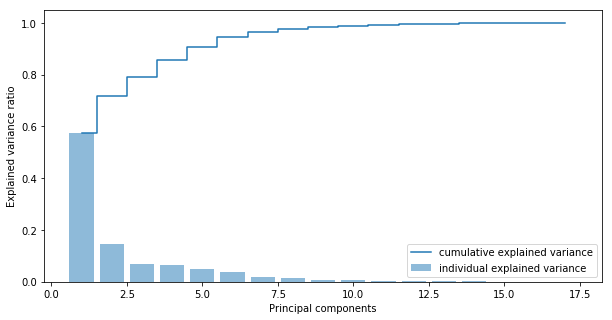

<Figure size 432x288 with 0 Axes>

In [110]:
plt.figure(figsize=(10 , 5))
plt.bar(range(1, eigenvalues.size + 1), var_explained, alpha=0.5, align='center', label='individual explained variance')
plt.step(range(1, eigenvalues.size + 1),cum_var_exp, where= 'mid', label='cumulative explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal components')
plt.legend(loc = 'best')
plt.show()
plt.tight_layout()
plt.show()

after 8 dimensions the information gain is very less so I will prefer to use 8 top dimensions

In [111]:
#reducing  to 8 dimension
P_reduce = np.array(train_eigvectors_sorted[0:8]) 
X_std_8 = np.dot(X_train_sd,P_reduce.T)
df_8 = pd.DataFrame(X_std_8)

In [112]:
df_8.head()
df_8.shape

,0,1,2,3,4,5,6,7
0,-0.600629,-0.630711,-0.513678,0.736533,-1.023849,1.648077,0.346685,-0.657331
1,1.554541,0.009978,-0.118980,-1.164360,-0.431546,0.031590,-0.209714,0.142472
2,-4.014376,0.113443,-1.200677,-0.341872,0.666718,0.737466,-0.767487,0.227005
3,1.663501,-2.470653,-0.432267,-0.334576,-0.751370,-0.522814,-0.067109,-0.174904
4,-5.728519,3.975898,1.266212,-0.121244,2.277024,-2.140389,-0.659414,0.463194


(824, 8)

### 4. Use Support vector machines and use grid search (try C values - 0.01, 0.05, 0.5, 1 and kernel = linear, rbf) and find out the best hyper parameters and do cross validation to find the accuracy. (10 points)

In [113]:
X_train, X_test, y_train, y_test = train_test_split(df_8, Y, test_size=0.30, random_state=10)

In [114]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(576, 8)
(576,)
(248, 8)
(248,)


C:\Users\rajan\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


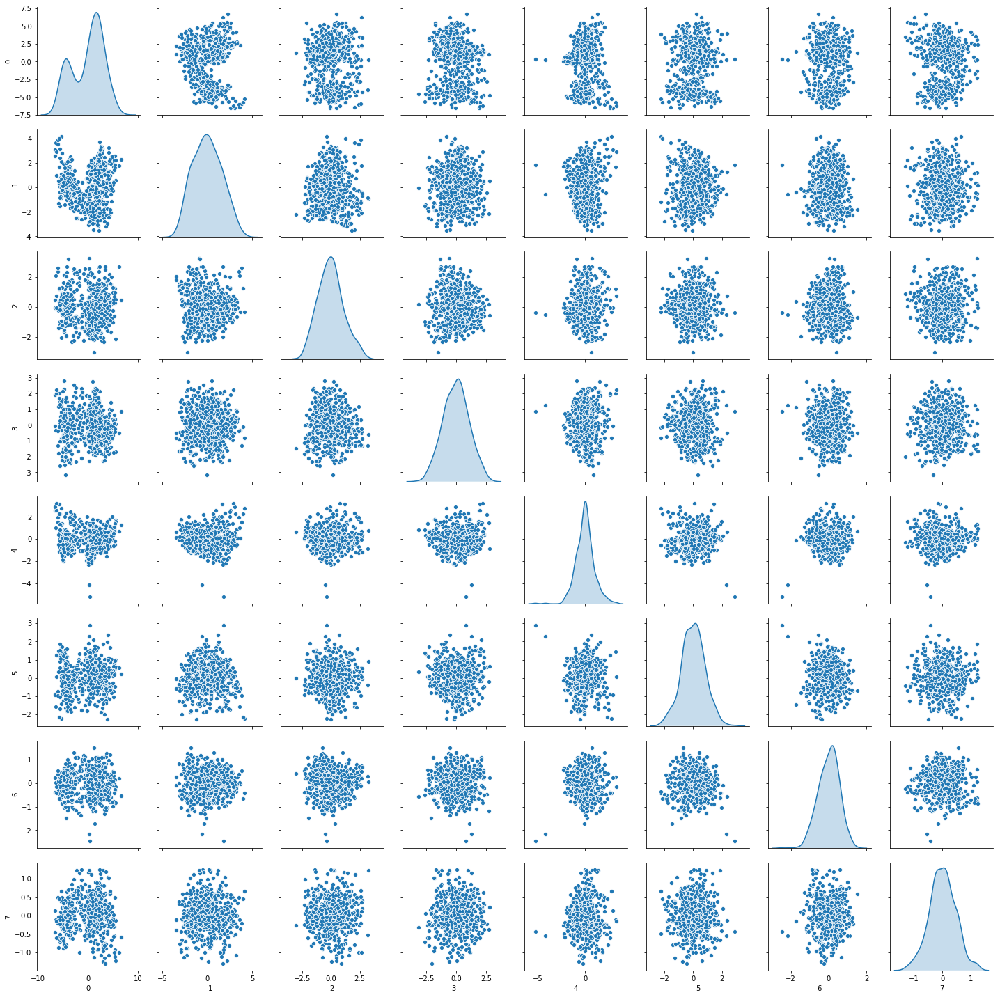

In [115]:
sns.pairplot(X_train, diag_kind='kde') 

In [116]:
svclassifier = SVC(kernel='linear')  
svclassifier.fit(X_train, y_train)  

SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
  kernel='linear', max_iter=-1, probability=False, random_state=None,
  shrinking=True, tol=0.001, verbose=False)

In [117]:
y_pred = svclassifier.predict(X_test)  

In [118]:
print(confusion_matrix(y_test,y_pred))  
print(classification_report(y_test,y_pred))  

[[118   8   5]
 [  5  51   2]
 [  5   2  52]]
              precision    recall  f1-score   support

           1       0.92      0.90      0.91       131
           2       0.84      0.88      0.86        58
           3       0.88      0.88      0.88        59

   micro avg       0.89      0.89      0.89       248
   macro avg       0.88      0.89      0.88       248
weighted avg       0.89      0.89      0.89       248



In [119]:
svcRbfclassifier = SVC(kernel='rbf')  
svcRbfclassifier.fit(X_train, y_train) 

C:\Users\rajan\Anaconda3\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
  kernel='rbf', max_iter=-1, probability=False, random_state=None,
  shrinking=True, tol=0.001, verbose=False)

In [120]:
y_pred = svcRbfclassifier.predict(X_test)  

In [121]:
print(confusion_matrix(y_test,y_pred))  
print(classification_report(y_test,y_pred)) 

[[125   0   6]
 [  1  56   1]
 [  7   3  49]]
              precision    recall  f1-score   support

           1       0.94      0.95      0.95       131
           2       0.95      0.97      0.96        58
           3       0.88      0.83      0.85        59

   micro avg       0.93      0.93      0.93       248
   macro avg       0.92      0.92      0.92       248
weighted avg       0.93      0.93      0.93       248



SVC model with RBF kernel is giving better accuracy and precision score

Lets use Grid search

In [122]:
model = SVC()
#Hyper Parameters Set
params = {'C':[0.01, 0.05, 0.5, 1],
          'kernel': ['linear','rbf']}
model1 = GridSearchCV(model, param_grid=params, n_jobs=-1)
#Train the model
model1.fit(X_train, y_train)
#The best hyper parameters set
print("Best Hyper Parameters:",model1.best_params_)
#Prediction
prediction=model1.predict(X_test)
## Evaluation
# Accuracy
print("Accuracy:",metrics.accuracy_score(prediction,y_test))
# Confusion Metrix 
print("Confusion Metrix:   \n", metrics.confusion_matrix(prediction,y_test))

C:\Users\rajan\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:2053: FutureWarning: You should specify a value for 'cv' instead of relying on the default value. The default value will change from 3 to 5 in version 0.22.
  warnings.warn(CV_WARNING, FutureWarning)
C:\Users\rajan\Anaconda3\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


GridSearchCV(cv='warn', error_score='raise-deprecating',
       estimator=SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
  kernel='rbf', max_iter=-1, probability=False, random_state=None,
  shrinking=True, tol=0.001, verbose=False),
       fit_params=None, iid='warn', n_jobs=-1,
       param_grid={'C': [0.01, 0.05, 0.5, 1], 'kernel': ['linear', 'rbf']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=0)

Best Hyper Parameters: {'C': 1, 'kernel': 'rbf'}
Accuracy: 0.9274193548387096
Confusion Metrix:   
 [[125   1   7]
 [  0  56   3]
 [  6   1  49]]


Best Hyper Parameters: {'C': 1, 'kernel': 'rbf'}